# Context Vector Analysis: Histogram

- Analysis 4:
    - As said earlier, Analysis 1: point 1 and 2, what is the right way of clustering?
    - Let's do the following and analyze.
    - Try 20,000 sentence. Eesun: go ahead with completely random sentences and sentences with similar meaning (concentrated). Beck: go head with book. Find any book with ~10,000 sentences.
    - Do the traditional steps and find the number of points in each clusters.
    - Normalize the vector by dividing it with the maximum value.
    - Now cluster the clusters. Perform a histogram on the normalized vector.
    - Bin the x axis into 20 or 30 equally spaced bins. For example, 0.05, 0.1, 0.15.. till 1.
    - Find the number of indices of this vector which falls under each bins.
    - Save the (number of clusters) count in a vector.
    - Rearrange them, and plot the count in y-axis and bins in the x-axis.
    - Plot the log log plot using the count matrix.
    - Fit the log log plot with linear line and get the slope.
- Analysis 5:
    - What do we know about this clustering? How are they clustered? What made each sentences to cluster?
    - Can you guys sample a cluster with around ~30-50 sentences and visualize them? Let's print and visualize. Then let's decide what to do.
- Analysis 6:
    - How to build the hierarchy or the knowledge graph? Or the better question is, for random points and clusters, find the adjacent token cluster. Are they similar?
    - Let's analyze taxonomy,
    - Currently thinking (I'll think more about this analysis and let you guys know)

In [50]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.2/491.2 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.9/183.9 kB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 17.2 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2025.3.2
    Uninstalling fsspec-2025.3.2:
      Successfully uninstalled fsspec-2025.3.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system =

In [3]:
!pip install kneed

In [51]:
from datasets import load_dataset
import nltk
from tqdm import tqdm
import torch
from transformers import BertTokenizer, BertModel
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from scipy.stats import linregress
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
import networkx as nx
import matplotlib.pyplot as plt
# from kneed import KneeLocator
from collections import Counter, defaultdict

In [52]:
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

## Analysis 4:

### 1. Dataset & Model

1. General
2. BookCorpus contained "Love" or "Romance"
3. Romance Book

In [53]:
target_sentences = 10000 # 10000

In [54]:
# 1 General: Wikipedia 30,000 sentences

general_ds = load_dataset("wikimedia/wikipedia", "20231101.en", streaming=True)

general_sentences = []

stream = general_ds["train"]

for example in tqdm(stream):
    text = example["text"]
    article_sentences = nltk.sent_tokenize(text)

    general_sentences.extend(article_sentences)

    if len(general_sentences) >= target_sentences:
        general_sentences = general_sentences[:target_sentences]
        break

print(f"Collected {len(general_sentences)} sentences.")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/131k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/41 [00:00<?, ?it/s]

37it [00:02, 13.05it/s]

Collected 10000 sentences.


In [55]:
# 2 BookCorpus contained "Love" or "Romance"

book_ds = load_dataset("bookcorpus", split="train", streaming=True, trust_remote_code=True)

love_sentences = []

for example in iter(book_ds):
    text = example["text"]  # Each example is a dictionary
    if "love" in text.lower() or "romance" in text.lower():
        sentences = text.split(". ")  # Split into sentences
        love_sentences.extend(sentences)

    if len(love_sentences) >= target_sentences:
        break

print(f"Collected {len(love_sentences)} sentences.")

README.md:   0%|          | 0.00/18.5k [00:00<?, ?B/s]

bookcorpus.py:   0%|          | 0.00/3.25k [00:00<?, ?B/s]

Collected 10000 sentences.


In [56]:
general_sentences = general_sentences[:target_sentences]
love_sentences = love_sentences[:target_sentences]

In [ ]:
# Load Model

model_name = "bert-base-uncased"

tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_hidden_states=True)
model.eval()

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

### 2. Feature Extraction

In [ ]:
## define the function that extracts Features

def get_features(sentence, model, tokenizer, layer_indices=[-1, -4]):
    inputs = tokenizer(sentence, return_tensors="pt", truncation=True, padding=True, max_length=128)

    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)  # Ensure hidden states are returned

    hidden_states = outputs.hidden_states  # Extract all hidden states

    # Extract final layer embedding (CLS token representation)
    final_layer_emb = hidden_states[layer_indices[0]][:, 0, :].squeeze(0).cpu().numpy()

    # Extract intermediate layer embedding (e.g., -4th layer)
    intermediate_layer_emb = hidden_states[layer_indices[1]][:, 0, :].squeeze(0).cpu().numpy()

    return final_layer_emb, intermediate_layer_emb

In [ ]:
def store_features(sentences):
  batch_size = 32
  num_batches = len(sentences) // batch_size + (len(sentences) % batch_size != 0)

  final_embeddings = []
  intermediate_embeddings = []

  for i in range(num_batches):
      batch = sentences[i * batch_size: (i + 1) * batch_size]

      # Get embeddings from model
      batch_final_emb, batch_inter_emb = zip(*[get_features(sent, model, tokenizer) for sent in batch])

      final_embeddings.extend(batch_final_emb)
      intermediate_embeddings.extend(batch_inter_emb)

  final_embeddings = np.array(final_embeddings)
  intermediate_embeddings = np.array(intermediate_embeddings)

  print("Final embedding shape:", final_embeddings.shape)
  print("Intermediate embedding shape:", intermediate_embeddings.shape)

  return final_embeddings, intermediate_embeddings

In [ ]:
gene_final_embeddings, gene_inter_embeddings = store_features(general_sentences)
love_final_embeddings, love_inter_embeddings = store_features(love_sentences)

Final embedding shape: (10000, 768)
Intermediate embedding shape: (10000, 768)
Final embedding shape: (10000, 768)
Intermediate embedding shape: (10000, 768)


- Save embeddings

In [ ]:
def save_embeddings(final_emb, inter_emb, prefix):
    np.save(f"{prefix}_final.npy", final_emb)
    np.save(f"{prefix}_inter.npy", inter_emb)
    print(f"Saved embeddings with prefix '{prefix}'")

In [ ]:
save_embeddings(gene_final_embeddings, gene_inter_embeddings, "general")
save_embeddings(love_final_embeddings, love_inter_embeddings, "love")

- Load embeddings

In [5]:
def load_embeddings(prefix):
    final_emb = np.load(f"/content/{prefix}_final.npy")
    inter_emb = np.load(f"/content/{prefix}_inter.npy")
    print(f"Loaded embeddings with prefix '{prefix}'")
    return final_emb, inter_emb

In [6]:
gene_final_embeddings, gene_inter_embeddings = load_embeddings("general")
love_final_embeddings, love_inter_embeddings = load_embeddings("love")

Loaded embeddings with prefix 'general'
Loaded embeddings with prefix 'love'


### 3. Cosine Similarity & Grouping

In [2]:
# Simple Greedy Approcah
def grouping(cos_similar, n, thres):
  groups = []
  visited = set()

  for i in range(n):
    if i in visited:
      continue

    group = [i]
    visited.add(i)

    for j in range(n):
      if j not in visited and cos_similar[i][j] >= thres:
        group.append(j)
        visited.add(j)

    groups.append(group)

  return groups


# graph-based grouping (connected componenets) - clustering
def graph_based_grouping(cos_similar, n, thres):
  graph = nx.Graph()

  graph.add_nodes_from(range(n))

  for i in range(n):
    for j in range(i+1, n):
      if cos_similar[i][j] >= thres:
        graph.add_edge(i, j)

  groups = [list(component) for component in nx.connected_components(graph)]

  return groups


# Clustering using DBSCAN
def clustering_grouping(embedding, thres):
  eps = 1 - thres
  clustering = DBSCAN(eps=eps, min_samples=2, metric="cosine").fit(embedding)
  labels = clustering.labels_

  # print("The number of clusters:", len(set(labels))-(1 if -1 in labels else 0))

  groups = {}
  for idx, label in enumerate(labels):
    if label not in groups:
      groups[label] = []
    groups[label].append(idx)
  return list(groups.values())

In [3]:
### Kmeans - elbow analysis

def kmeans_elbow(embeddings, k_range):
    inertias = []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
        kmeans.fit(embeddings)
        inertias.append(kmeans.inertia_)
    return inertias # within-cluster sum of squres

def plot_elbow_with_knee(k_range, inertias, title="KMeans Elbow Plot"):
    k_vals = list(k_range)

    kl = KneeLocator(k_vals, inertias, curve="convex", direction="decreasing")
    optimal_k = kl.elbow

    plt.figure(figsize=(8, 5))
    plt.plot(k_vals, inertias, marker='o', label="Inertia")
    if optimal_k:
        plt.axvline(optimal_k, color='red', linestyle='--', label=f"Optimal k = {optimal_k}")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("Inertia")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

    return optimal_k

In [7]:
gene_final_cos_similar = cosine_similarity(gene_final_embeddings)
gene_inter_cos_similar = cosine_similarity(gene_inter_embeddings)

love_final_cos_similar = cosine_similarity(love_final_embeddings)
love_inter_cos_similar = cosine_similarity(love_inter_embeddings)

In [8]:
print("Cosine Similarity: Final(General)")
print(np.round(gene_final_cos_similar[:5, :5], 2))
print("Cosine Similarity: Intermediate(General)")
print(np.round(gene_inter_cos_similar[:5, :5], 2))

print("Cosine Similarity: Final(Love)")
print(np.round(love_final_cos_similar[:5, :5], 2))
print("Cosine Similarity: Intermediate(Love)")
print(np.round(love_inter_cos_similar[:5, :5], 2))

Cosine Similarity: Final(General)
[[1.   0.82 0.84 0.71 0.75]
 [0.82 1.   0.84 0.73 0.84]
 [0.84 0.84 1.   0.76 0.83]
 [0.71 0.73 0.76 1.   0.75]
 [0.75 0.84 0.83 0.75 1.  ]]
Cosine Similarity: Intermediate(General)
[[1.   0.72 0.85 0.69 0.71]
 [0.72 1.   0.77 0.79 0.86]
 [0.85 0.77 1.   0.82 0.8 ]
 [0.69 0.79 0.82 1.   0.84]
 [0.71 0.86 0.8  0.84 1.  ]]
Cosine Similarity: Final(Love)
[[1.   0.89 0.86 0.84 0.89]
 [0.89 1.   0.89 0.86 0.91]
 [0.86 0.89 1.   0.89 0.88]
 [0.84 0.86 0.89 1.   0.89]
 [0.89 0.91 0.88 0.89 1.  ]]
Cosine Similarity: Intermediate(Love)
[[1.   0.92 0.88 0.86 0.92]
 [0.92 1.   0.91 0.89 0.94]
 [0.88 0.91 1.   0.91 0.9 ]
 [0.86 0.89 0.91 1.   0.91]
 [0.92 0.94 0.9  0.91 1.  ]]


In [ ]:
n = len(sentences)
thres = 0.9

gene_final_greedy = grouping(gene_final_cos_similar, n, thres)
gene_inter_greedy = grouping(gene_inter_cos_similar, n, thres)

love_final_greedy = grouping(love_final_cos_similar, n, thres)
love_inter_greedy = grouping(love_inter_cos_similar, n, thres)

In [ ]:
print("--General Sentences--")
print(f"Greedy Clustering (Final Layer): {len(gene_final_greedy)} clusters")
print(f"Greedy Clustering (Intermediate Layer): {len(gene_inter_greedy)} clusters\n")

print("--Love Sentences--")
print(f"Greedy Clustering (Final Layer): {len(love_final_greedy)} clusters")
print(f"Greedy Clustering (Intermediate Layer): {len(love_inter_greedy)} clusters")

--General Sentences--
Greedy Clustering (Final Layer): 1 clusters
Greedy Clustering (Intermediate Layer): 1 clusters

--Love Sentences--
Greedy Clustering (Final Layer): 1 clusters
Greedy Clustering (Intermediate Layer): 1 clusters


In [9]:
def grouping_from_cos_sim(clustering_type, gene_final_cos_similar, gene_inter_cos_similar, love_final_cos_similar, love_inter_cos_similar, thres):
  print(f"--{clustering_type}--")

  if clustering_type=="greedy":
    gene_final_cluster = grouping(gene_final_cos_similar, n, thres)
    gene_inter_cluster = grouping(gene_inter_cos_similar, n, thres)

    love_final_cluster = grouping(love_final_cos_similar, n, thres)
    love_inter_cluster = grouping(love_inter_cos_similar, n, thres)

  elif clustering_type == "graph":
    gene_final_cluster = graph_based_grouping(gene_final_cos_similar, n, thres)
    gene_inter_cluster = graph_based_grouping(gene_inter_cos_similar, n, thres)

    love_final_cluster = graph_based_grouping(love_final_cos_similar, n, thres)
    love_inter_cluster = graph_based_grouping(love_inter_cos_similar, n, thres)

  print("--General Sentences--")
  print(f"Greedy Clustering (Final Layer): {len(gene_final_cluster)} clusters")
  print(f"Greedy Clustering (Intermediate Layer): {len(gene_inter_cluster)} clusters\n")

  print("--Love Sentences--")
  print(f"Greedy Clustering (Final Layer): {len(love_final_cluster)} clusters")
  print(f"Greedy Clustering (Intermediate Layer): {len(love_inter_cluster)} clusters")

  return gene_final_cluster, gene_inter_cluster, love_final_cluster, love_inter_cluster

In [10]:
print(gene_final_embeddings.shape)
print(gene_final_embeddings.shape[0])

(10000, 768)
10000


In [11]:
n = gene_final_embeddings.shape[0]
thres = 0.8

for clustering_type in ["greedy", "graph"]:
  grouping_from_cos_sim(clustering_type, gene_final_cos_similar, gene_inter_cos_similar, love_final_cos_similar, love_inter_cos_similar, thres)

--greedy--
--General Sentences--
Greedy Clustering (Final Layer): 948 clusters
Greedy Clustering (Intermediate Layer): 153 clusters

--Love Sentences--
Greedy Clustering (Final Layer): 98 clusters
Greedy Clustering (Intermediate Layer): 89 clusters
--graph--
--General Sentences--
Greedy Clustering (Final Layer): 106 clusters
Greedy Clustering (Intermediate Layer): 3 clusters

--Love Sentences--
Greedy Clustering (Final Layer): 8 clusters
Greedy Clustering (Intermediate Layer): 7 clusters


In [42]:
def count_sentences_per_cluster(embeddings, optimal_k):
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
    labels = kmeans.fit_predict(embeddings)

    cluster_to_indices = defaultdict(list)
    for idx, label in enumerate(labels):
        cluster_to_indices[label].append(idx)

    cluster_counts = {k: len(v) for k, v in cluster_to_indices.items()}
    sorted_counts = sorted(cluster_counts.values(), reverse=True)

    return sorted_counts, cluster_to_indices

In [ ]:
def clustering_and_print(clustering_type, gene_final_embeddings, gene_inter_embeddings, love_final_embeddings, love_inter_embeddings, thres):
  print(f"--{clustering_type}--")

  if clustering_type=="kmeans":
    k_range = range(50, 500, 10)

    for layer_name, embeddings in zip(["Final", "Intermediate"], [gene_final_embeddings, gene_inter_embeddings]):
        inertias = kmeans_elbow(embeddings, k_range)
        if layer_name == "Final":
          optimal_k_general_final = plot_elbow_with_knee(k_range, inertias, title=f"KMeans Elbow Plot ({layer_name} Layer)")
          print(f"Optimal k for {layer_name} Layer: {optimal_k_general_final}")
        else:
          optimal_k_general_inter = plot_elbow_with_knee(k_range, inertias, title=f"KMeans Elbow Plot ({layer_name} Layer)")
          print(f"Optimal k for {layer_name} Layer: {optimal_k_general_inter}")

    for layer_name, embeddings in zip(["Final", "Intermediate"], [love_final_embeddings, love_inter_embeddings]):
        inertias = kmeans_elbow(embeddings, k_range)
        optimal_k_love = plot_elbow_with_knee(k_range, inertias, title=f"KMeans Elbow Plot ({layer_name} Layer)")
        print(f"Optimal k for {layer_name} Layer: {optimal_k_love}")
        if layer_name == "Final":
          optimal_k_love_final = plot_elbow_with_knee(k_range, inertias, title=f"KMeans Elbow Plot ({layer_name} Layer)")
          print(f"Optimal k for {layer_name} Layer: {optimal_k_love_final}")
        else:
          optimal_k_love_inter = plot_elbow_with_knee(k_range, inertias, title=f"KMeans Elbow Plot ({layer_name} Layer)")
          print(f"Optimal k for {layer_name} Layer: {optimal_k_love_inter}")

  elif clustering_type == "dbscan":
    gene_final_cluster = clustering_grouping(gene_final_embeddings, n, thres)
    gene_inter_cluster = clustering_grouping(gene_inter_embeddings, n, thres)

    love_final_cluster = clustering_grouping(love_final_embeddings, n, thres)
    love_inter_cluster = clustering_grouping(love_inter_embeddings, n, thres)

  gene_final_group_counts = count_sentences_per_cluster(gene_final_embeddings, optimal_k_general_final)
  gene_inter_group_counts = count_sentences_per_cluster(gene_inter_embeddings, optimal_k_general_inter)
  love_final_group_counts = count_sentences_per_cluster(love_final_embeddings, optimal_k_love_final)
  love_inter_group_counts = count_sentences_per_cluster(love_inter_embeddings, optimal_k_love_inter)


  if clustering_type=="kmeans":
    print("--K-means Grouping--")
    print("General")
    print("Final layers' Group Counts:", gene_final_group_counts[:5])
    print("Intermediate layers' Group Counts:", gene_inter_group_counts[:5])

    print("Love")
    print("Final layers' Group Counts:", love_final_group_counts[:5])
    print("Intermediate layers' Group Counts:", love_inter_group_counts[:5])


  else:
    print("--General Sentences--")
    print(f"Greedy Clustering (Final Layer): {len(gene_final_cluster)} clusters")
    print(f"Greedy Clustering (Intermediate Layer): {len(gene_inter_cluster)} clusters\n")

    print("--Love Sentences--")
    print(f"Greedy Clustering (Final Layer): {len(love_final_cluster)} clusters")
    print(f"Greedy Clustering (Intermediate Layer): {len(love_inter_cluster)} clusters")

  return gene_final_cluster, gene_inter_cluster, love_final_cluster, love_inter_cluster

--kmeans--


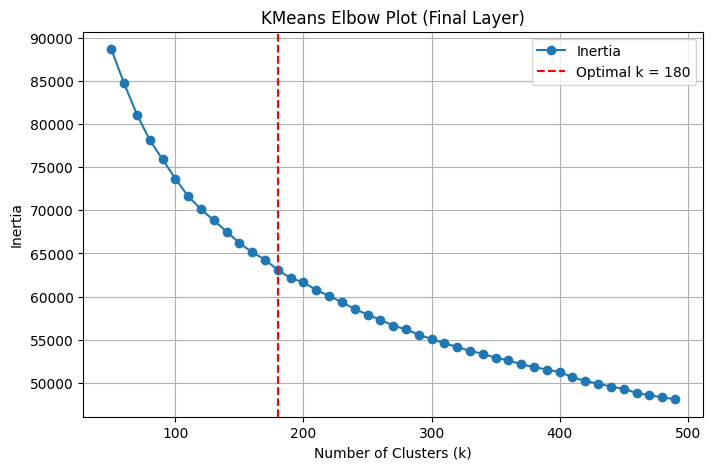

Optimal k for Final Layer: 180


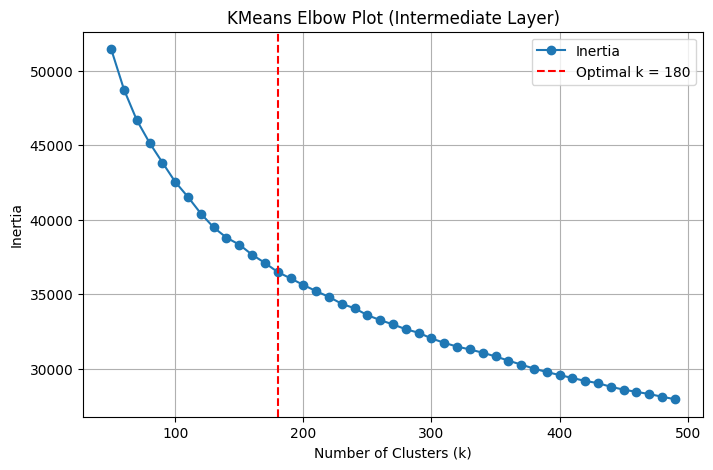

Optimal k for Intermediate Layer: 180


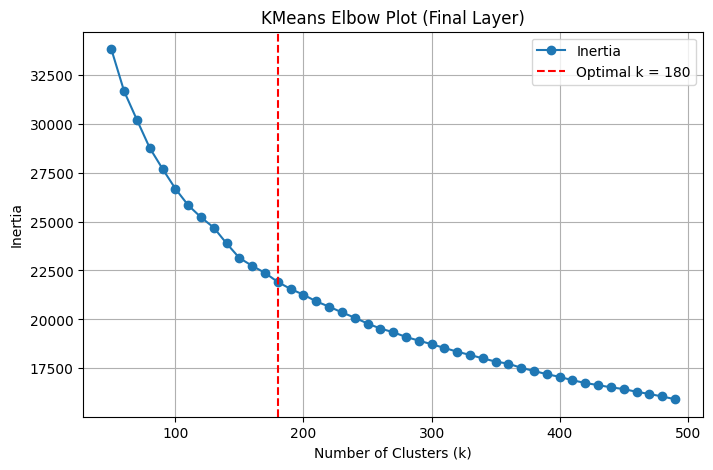

Optimal k for Final Layer: 180


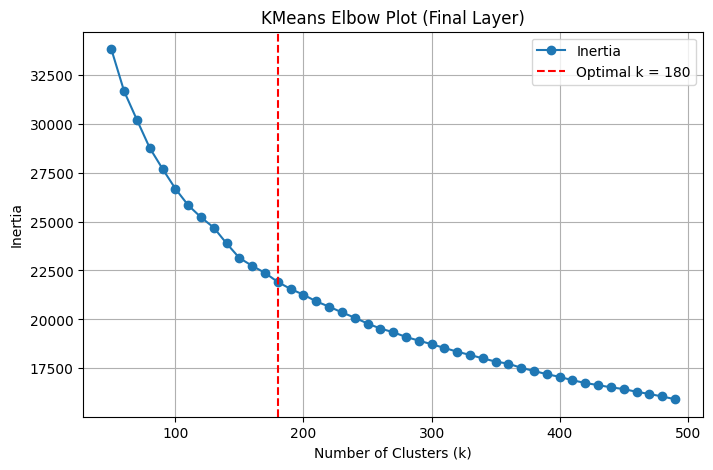

Optimal k for Final Layer: 180


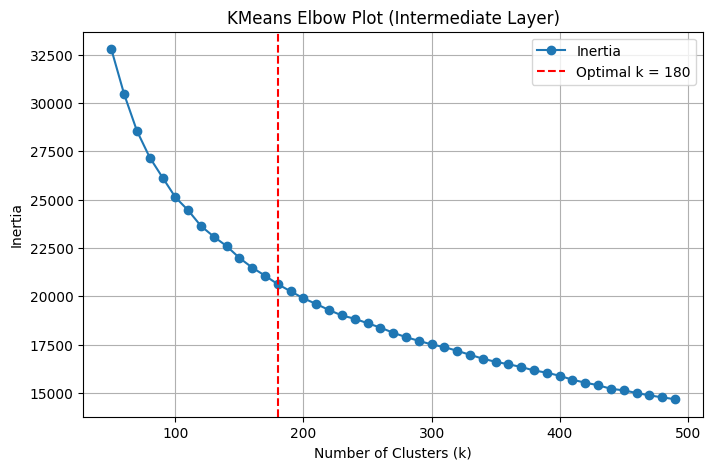

Optimal k for Intermediate Layer: 180


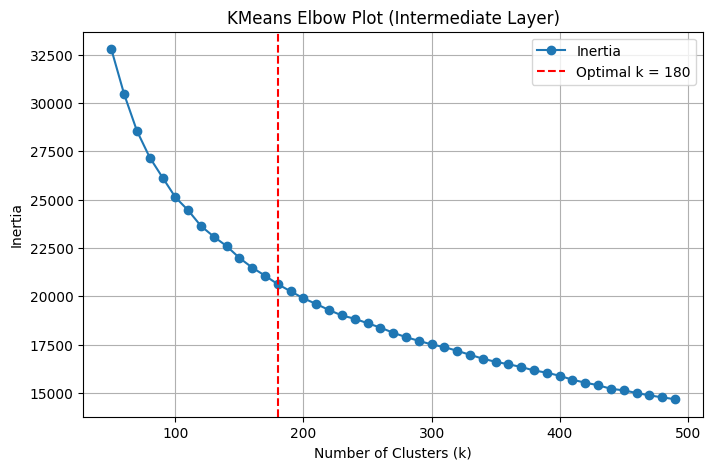

Optimal k for Intermediate Layer: 180
--K-means Grouping--
General
Final layers' Group Counts: [125, 122, 121, 120, 113]
Intermediate layers' Group Counts: [154, 141, 124, 123, 123]
Love
Final layers' Group Counts: [1167, 126, 123, 123, 121]
Intermediate layers' Group Counts: [1164, 147, 143, 137, 130]


UnboundLocalError: cannot access local variable 'gene_final_cluster' where it is not associated with a value

In [ ]:
for clustering_type in ["kmeans", "dbscan"]:
  clustering_and_print(clustering_type, gene_final_cos_similar, gene_inter_cos_similar, love_final_cos_similar, love_inter_cos_similar, thres)

In [43]:
def clustering_ml(clustering_type, gene_final_embeddings, gene_inter_embeddings, love_final_embeddings, love_inter_embeddings, thres):
  print(f"--{clustering_type}--")
  optimal_k = 180

  if clustering_type=="kmeans":
    gene_final_group_counts, gene_final_cluster = count_sentences_per_cluster(gene_final_embeddings, optimal_k)
    gene_inter_group_counts, gene_inter_cluster = count_sentences_per_cluster(gene_inter_embeddings, optimal_k)
    love_final_group_counts, love_final_cluster = count_sentences_per_cluster(love_final_embeddings, optimal_k)
    love_inter_group_counts, love_inter_cluster = count_sentences_per_cluster(love_inter_embeddings, optimal_k)

  elif clustering_type == "dbscan":
    gene_final_cluster = clustering_grouping(gene_final_embeddings, thres)
    gene_inter_cluster = clustering_grouping(gene_inter_embeddings, thres)

    love_final_cluster = clustering_grouping(love_final_embeddings, thres)
    love_inter_cluster = clustering_grouping(love_inter_embeddings, thres)


  if clustering_type=="kmeans":
    print("--K-means Grouping--")
    print("General")
    print("Final layers' Group Counts:", gene_final_group_counts[:5])
    print("Intermediate layers' Group Counts:", gene_inter_group_counts[:5])

    print("Love")
    print("Final layers' Group Counts:", love_final_group_counts[:5])
    print("Intermediate layers' Group Counts:", love_inter_group_counts[:5])

    return gene_final_group_counts, gene_inter_group_counts, love_final_group_counts, love_inter_group_counts, gene_final_cluster, gene_inter_cluster, love_final_cluster, love_inter_cluster

  else:
    print("--General Sentences--")
    print(f"Greedy Clustering (Final Layer): {len(gene_final_cluster)} clusters")
    print(f"Greedy Clustering (Intermediate Layer): {len(gene_inter_cluster)} clusters\n")

    print("--Love Sentences--")
    print(f"Greedy Clustering (Final Layer): {len(love_final_cluster)} clusters")
    print(f"Greedy Clustering (Intermediate Layer): {len(love_inter_cluster)} clusters")

    return gene_final_cluster, gene_inter_cluster, love_final_cluster, love_inter_cluster

In [45]:
for clustering_type in ["kmeans", "dbscan"]:
  if clustering_type == "kmeans":
    gene_final_group_counts_kmeans, gene_inter_group_counts_kmeans, love_final_group_counts_kmeans, love_inter_group_counts_kmeans, gene_final_cluster, gene_inter_cluster, love_final_cluster, love_inter_cluster = clustering_ml(clustering_type, gene_final_embeddings, gene_inter_embeddings, love_final_embeddings, love_inter_embeddings, thres)
  else:
    gene_final_group_counts_dbscan, gene_inter_group_counts_dbscan, love_final_group_counts_dbscan, love_inter_group_counts_dbscan = clustering_ml(clustering_type, gene_final_embeddings, gene_inter_embeddings, love_final_embeddings, love_inter_embeddings, thres)

--kmeans--
--K-means Grouping--
General
Final layers' Group Counts: [166, 151, 142, 129, 124]
Intermediate layers' Group Counts: [131, 118, 113, 112, 109]
Love
Final layers' Group Counts: [1167, 112, 105, 104, 102]
Intermediate layers' Group Counts: [1167, 164, 159, 159, 157]
--dbscan--
--General Sentences--
Greedy Clustering (Final Layer): 8 clusters
Greedy Clustering (Intermediate Layer): 2 clusters

--Love Sentences--
Greedy Clustering (Final Layer): 3 clusters
Greedy Clustering (Intermediate Layer): 4 clusters


In this case, I selected a K-means clustering method.

- Counting

In [ ]:
def get_count(groups):
  group_counts = []
  word_counts = []

  for group in groups:
    group_counts.append(len(group))

    unique_words = set() # prevent duplicates
    for idx in group:
      unique_words.update(sentences[idx].split())
    word_counts.append(len(unique_words))
  return group_counts, word_counts # num of sentence per group, num of word per group

In [ ]:
print("--General Sentences--")
gene_final_group_counts, gene_final_word_counts = get_count(gene_final_greedy)
gene_inter_group_counts, gene_inter_word_counts = get_count(gene_inter_greedy)
print("Final layers' Group Counts:", gene_final_group_counts)
print("Intermediate layers' Group Counts:", gene_inter_group_counts)

print("--Love Sentences--")
love_final_group_counts, love_final_word_counts = get_count(love_final_greedy)
love_inter_group_counts, love_inter_word_counts = get_count(love_inter_greedy)
print("Final layers' Group Counts:", love_final_group_counts)
print("Intermediate layers' Group Counts:", love_inter_group_counts)

In [18]:
print("sanity check using the number of sentences in each group\n")

print("--General Sentences--")
print("The total number of sentences in the Final layers:", sum(gene_final_group_counts_kmeans))
print("The total number of sentences in the Intermediate layers:", sum(gene_inter_group_counts_kmeans))
print("Sanity check result:", n == sum(gene_final_group_counts_kmeans) == sum(gene_inter_group_counts_kmeans))


print("\n--Love Sentences--")
print("The total number of sentences in the Final layers:", sum(love_final_group_counts_kmeans))
print("The total number of sentences in the Intermediate layers:", sum(love_inter_group_counts_kmeans))
print("Sanity check result:", n == sum(love_final_group_counts_kmeans) == sum(love_inter_group_counts_kmeans))

sanity check using the number of sentences in each group

--General Sentences--
The total number of sentences in the Final layers: 10000
The total number of sentences in the Intermediate layers: 10000
Sanity check result: True

--Love Sentences--
The total number of sentences in the Final layers: 10000
The total number of sentences in the Intermediate layers: 10000
Sanity check result: True


### 4. Plotting with Histogram

In [ ]:
def rearrange_decreasing_order(counts_vector):
  counts_vector = np.array(counts_vector)
  sorted_indices = np.argsort(-counts_vector)
  sorted_sent_counts = counts_vector[sorted_indices]
  return sorted_sent_counts

In [19]:
# Normalized
def normalize_counts(counts_vector):
    counts_vector = np.array(counts_vector)
    normalized = counts_vector / np.max(counts_vector)
    return normalized

In [28]:
def histogram_cluster_bins(normalized_vector, bin_size=0.05):
    # Step 2: Define bins from 0 to 1 (inclusive)
    bins = np.arange(0, 1.01, bin_size)  # [0.0, 0.05, 0.10, ..., 1.0]

    # Step 3: Digitize values to find which bin each value falls into
    bin_indices = np.digitize(normalized_vector, bins, right=True)

    # Step 4: Count how many points fall into each bin
    bin_counts = np.zeros(len(bins))
    for idx in bin_indices:
        if idx < len(bin_counts):  # just in case
            bin_counts[idx] += 1

    return bins, bin_counts

In [29]:
def plot_binned_loglog(flag, bins, counts, dataset_type):
    x = bins
    y = counts
    if flag:
      detail = "[Final layer]"
    else:
      detail = "[Intermediate layer]"

    # remove zeros to avoid log(0)
    nonzero_indices = y > 0
    log_x = np.log10(x[nonzero_indices])
    log_y = np.log10(y[nonzero_indices])

    # linear fit
    slope, intercept, *_ = linregress(log_x, log_y)

    # plot
    plt.figure(figsize=(8, 4))
    plt.bar(bins, counts, width=0.045, alpha=0.6, label=f'{flag}_{dataset_type}')
    plt.xlabel("Normalized Group Size")
    plt.ylabel("Number of Clusters")
    plt.title(f"Histogram of Normalized Cluster Sizes_{flag}_{dataset_type}")
    plt.legend()
    plt.grid(True)
    plt.show()

    return slope

In [ ]:
# rearrange in decreaing order (ranking)
gene_final_sorted_sent_counts = rearrange_decreasing_order(gene_final_group_counts)
gene_inter_sorted_sent_counts = rearrange_decreasing_order(gene_inter_group_counts)

love_final_sorted_sent_counts = rearrange_decreasing_order(love_final_group_counts)
love_inter_sorted_sent_counts = rearrange_decreasing_order(love_inter_group_counts)

In [30]:
def do_histogram_analysis(flag, sorted_sent_counts, dataset_type):
  normalized = normalize_counts(sorted_sent_counts)

  bins, bin_counts = histogram_cluster_bins(normalized)
  print("Binned Counts:", bin_counts)

  slope = plot_binned_loglog(flag, bins, bin_counts, dataset_type)
  print(f"Slope = {slope:.4f}")

Binned Counts: [ 0.  2.  2. 10. 18. 22. 27. 25. 23. 21. 14.  3.  3.  1.  3.  2.  1.  0.
  1.  1.  1.]


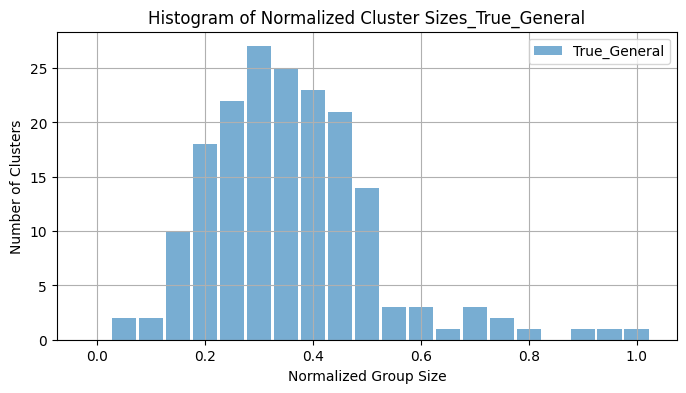

Slope = -0.5572
Binned Counts: [ 0.  2.  7.  8. 11. 18. 14.  9. 12. 17. 13. 15. 19. 14.  3.  7.  3.  4.
  2.  1.  1.]


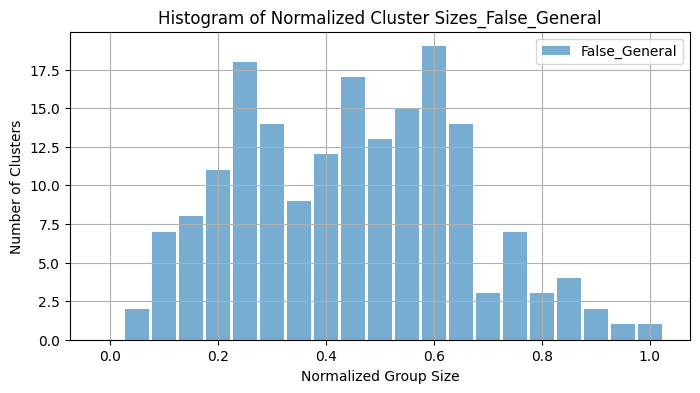

Slope = -0.2544
Binned Counts: [  0. 120.  59.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.]


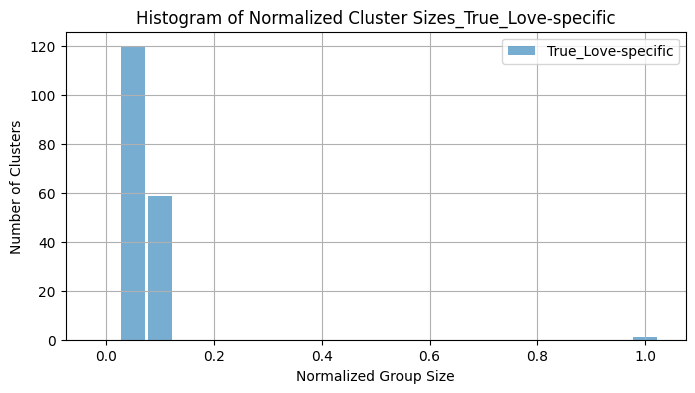

Slope = -1.6415
Binned Counts: [  0. 117.  51.  11.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   1.]


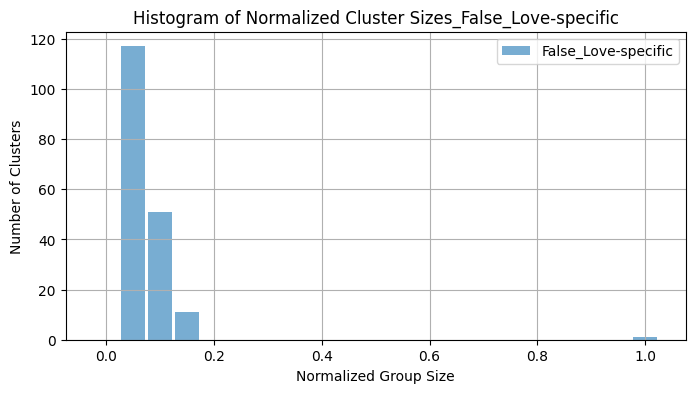

Slope = -1.6051


In [31]:
do_histogram_analysis(True, gene_final_group_counts_kmeans, "General")
do_histogram_analysis(False, gene_inter_group_counts_kmeans, "General")

do_histogram_analysis(True, love_final_group_counts_kmeans, "Love-specific")
do_histogram_analysis(False, love_inter_group_counts_kmeans, "Love-specific")

In [32]:
def hist_plotting(flag, sorted_sent_counts, dataset_type):
  if flag:
    detail = "[Final layer]"
  else:
    detail = "[Intermediate layer]"
  # x-axis
  plt.figure(figsize=(16,8))
  plt.plot(range(len(sorted_sent_counts)), sorted_sent_counts, marker='o', linestyle="-")


  plt.xlabel("Groupd Index (Sorted)")
  plt.ylabel("The Number of Sentences per group")
  plt.title(detail + " The Number of Sentences per Group - " + dataset_type)
  plt.grid(True)

  plt.show()

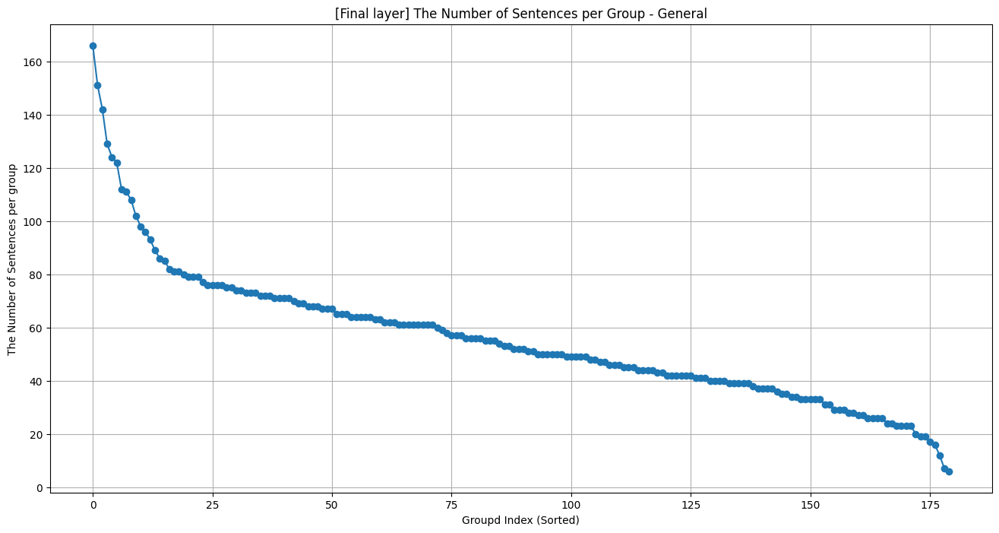

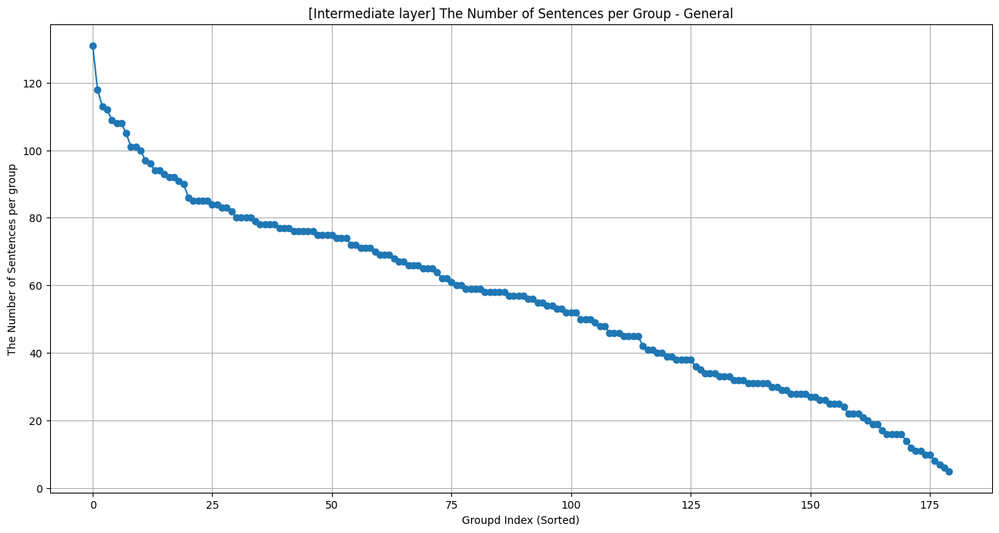

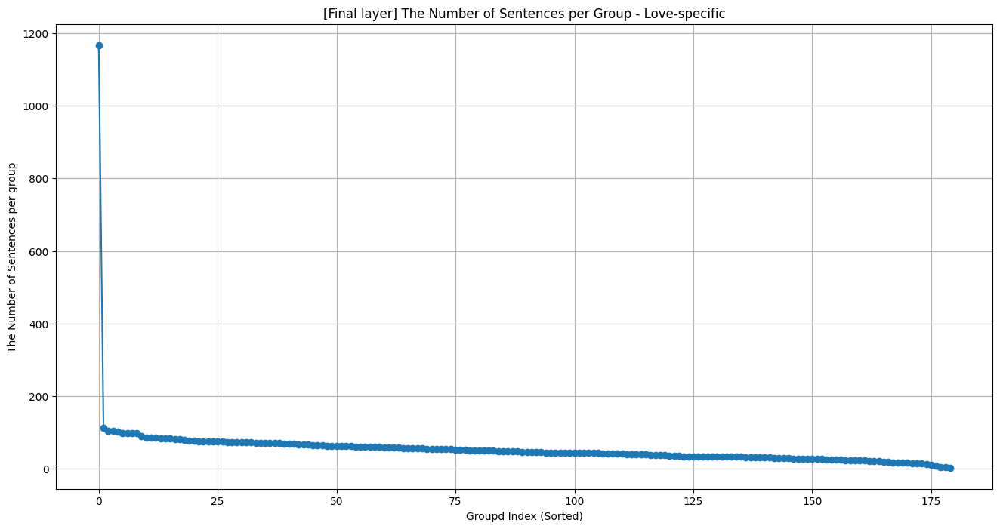

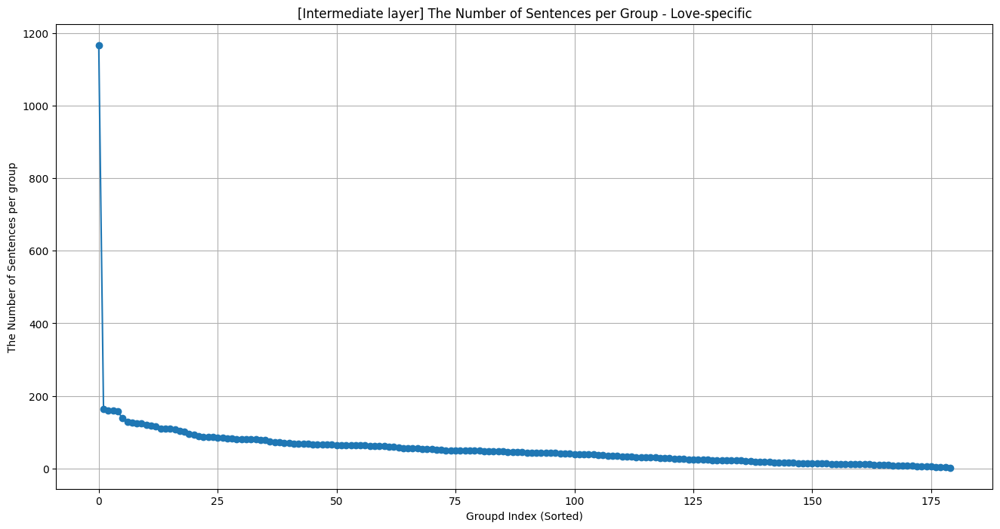

In [34]:
hist_plotting(True, gene_final_group_counts_kmeans, "General")
hist_plotting(False, gene_inter_group_counts_kmeans, "General")

hist_plotting(True, love_final_group_counts_kmeans, "Love-specific")
hist_plotting(False, love_inter_group_counts_kmeans, "Love-specific")

In [35]:
def linear_regression(sorted_sent_counts):
  x = np.log10(np.arange(1, len(sorted_sent_counts)+1))
  y = np.log10(sorted_sent_counts)

  # linear regression
  slope, intercept, r_val, p_val, std_err = linregress(x, y)

  # regression prediction
  y_pred = slope * x + intercept

  return x, y, slope, intercept, r_val, p_val, y_pred

In [36]:
def linear_regression_plotting(flag, sorted_sent_counts, model):
  if flag:
    detail = "[Final layer]"
  else:
    detail = "[Intermediate layer]"

  x, y, slope, intercept, r_val, p_val, y_pred = linear_regression(sorted_sent_counts)

  plt.figure(figsize=(16,8))
  plt.scatter(x, y, label="Sentences counts (Log-Log)", alpha=0.8, marker="o")
  plt.plot(x, y_pred, color = "red", label=f"Linear Fit: y={slope:.2f}x + {intercept:.2f}")
  plt.text(0.1, 1.2, f"$R^2$ = {r_val**2:.4f}", fontsize=14, color="black")

  plt.xlabel("Group Index (Log scale)")
  plt.ylabel("The Number of Sentences per group (Log scale)")
  plt.title(detail + "Linear Regression on Log-Log Scale - " + model)
  plt.legend()
  plt.grid(True)

  plt.show()

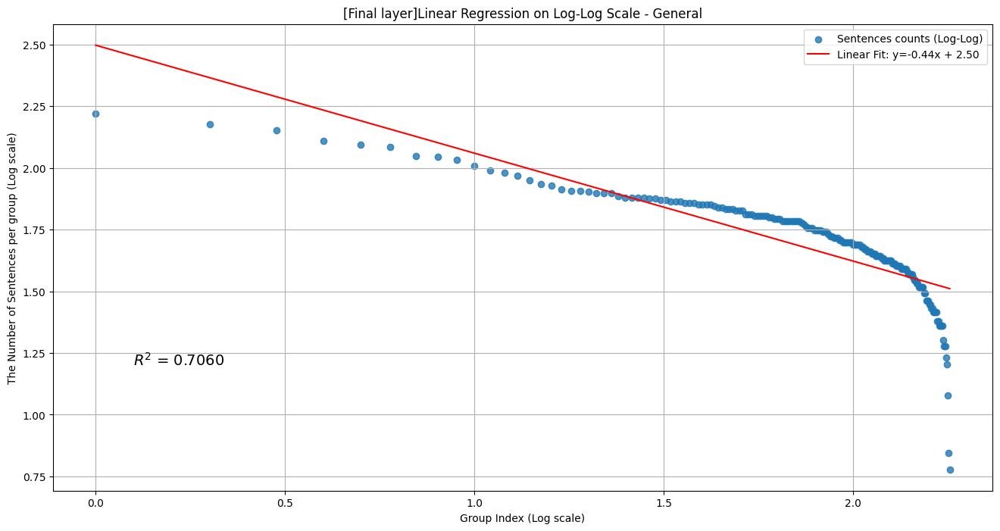

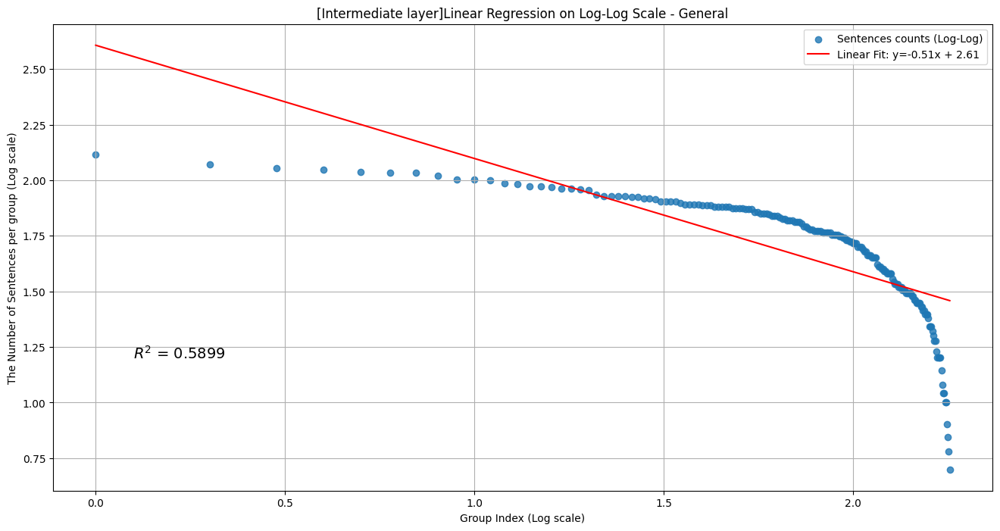

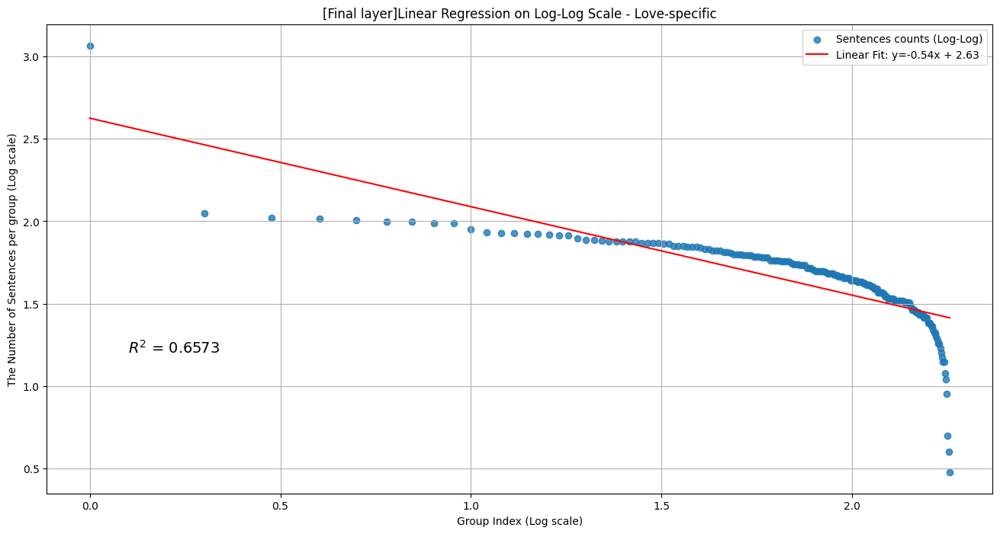

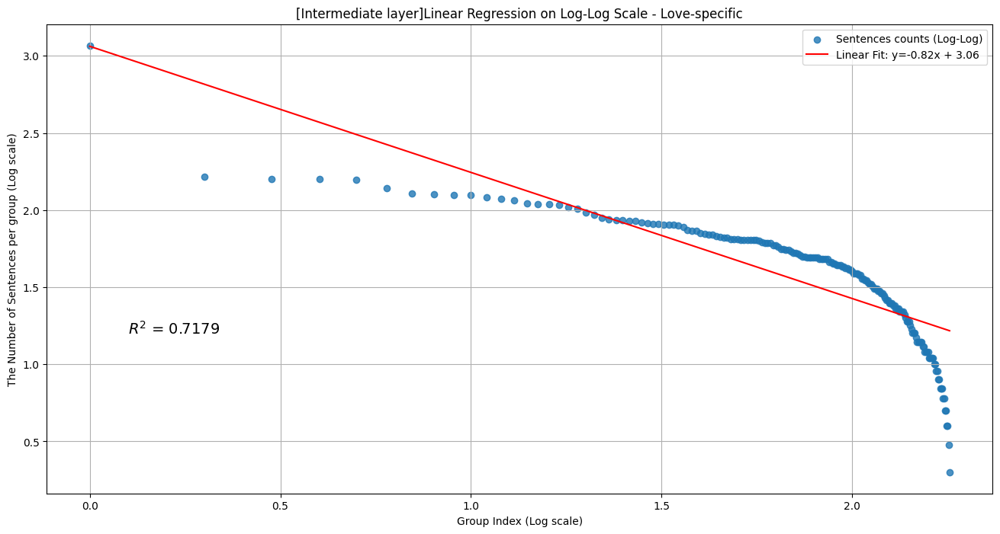

In [37]:
linear_regression_plotting(True, gene_final_group_counts_kmeans, "General")
linear_regression_plotting(False, gene_inter_group_counts_kmeans, "General")

linear_regression_plotting(True, love_final_group_counts_kmeans, "Love-specific")
linear_regression_plotting(False, love_inter_group_counts_kmeans, "Love-specific")

## Analysis 5:
- What do we know about this clustering? How are they clustered? What made each sentences to cluster?
- Can you guys sample a cluster with around ~30-50 sentences and visualize them? Let's print and visualize. Then let's decide what to do.


**What sentences of clusters are in the same bin area?**

In [68]:
def print_all_bins_cluster_samples(sentences, clusters, cluster_counts, num_bins=20, sample_size=5):
    normalized_counts = normalize_counts(cluster_counts)
    bins = np.linspace(0, 1, num_bins + 1)

    for bin_index in range(num_bins):
        bin_start = bins[bin_index]
        bin_end = bins[bin_index + 1]

        selected_clusters = [
            idx for idx, val in enumerate(normalized_counts)
            if bin_start <= val < bin_end
        ]

        if not selected_clusters:
            continue

        print(f"\n\n Bin [{bin_start:.2f}, {bin_end:.2f}) — {len(selected_clusters)} clusters")

        for cid in selected_clusters:
            cluster_size = len(clusters[cid])
            print(f"\n-- Cluster {cid} (size={cluster_size}) --")
            for idx in clusters[cid][:sample_size]:
                print("•", sentences[idx])


In [69]:
## general final
print_all_bins_cluster_samples(general_sentences, gene_final_cluster, gene_final_group_counts_kmeans)



 Bin [0.00, 0.05) — 2 clusters

-- Cluster 178 (size=56) --
• This last feature of Pliny's account is considered to be the iconic spit, called today Tendra (or Kosa Tendra and Kosa Djarilgatch), situated between the mouth of the Dnieper and Karkinit Bay, but which is hardly 125 Roman miles ( km) away from the Dnieper-Bug estuary, as Pliny states.
• In 1511, they took control over Cherchell and Jijel, and attacked Mostaganem where although they were not able to conquer the city, they were able to force a tribute on them.
• Until 1587 Beylerbeylik of Algiers was governed by Beylerbeys who served terms with no fixed limits.
• The new leader received the title of "Agha" then "Dey" in 1671, and the right to select passed to the divan, a council of some sixty military senior officers.
• It was at first dominated by the odjak; but by the 18th century, it had become the dey's instrument.

-- Cluster 179 (size=47) --
• Alabama () is a state in the Southeastern region of the United States, bor

In [70]:
## general intermediate
print_all_bins_cluster_samples(general_sentences, gene_inter_cluster, gene_inter_group_counts_kmeans)



 Bin [0.00, 0.05) — 2 clusters

-- Cluster 178 (size=45) --
• Aquaculture 

Aquaculture is a large part of the economy of Alabama.
• The legislative branch is the Alabama Legislature, a bicameral assembly composed of the Alabama House of Representatives, with 105 members, and the Alabama Senate, with 35 members.
• The current chief justice of the Alabama Supreme Court is Republican Tom Parker.
• All sitting justices on the Alabama Supreme Court are members of the Republican Party.
• The Alabama Alcoholic Beverage Control Board controls the sale and distribution of alcoholic beverages in the state.

-- Cluster 179 (size=58) --
• Humans have lived in societies without formal hierarchies long before the establishment of states, realms, or empires.
• Contemporary news coverage which emphasizes black bloc demonstrations has reinforced anarchism's historical association with chaos and violence.
• Anarchists usually form small groups (5–20 individuals) to enhance autonomy and friendships am

In [71]:
## love final
print_all_bins_cluster_samples(love_sentences, love_final_cluster, love_final_group_counts_kmeans)



 Bin [0.00, 0.05) — 120 clusters

-- Cluster 60 (size=74) --
• especially if the last woman he cared about loved someone else 
• someday 
• nadeen bought the lovely new clinical student a salad 
• i love that band 
• the boys would love a dinner night out 

-- Cluster 61 (size=97) --
• i could never , ever love another man like i do him 
• he thought his parents ' deaths would be the end of him ; two of the people he loved most in the world snuffed out with no chance to say good-bye .
• i thought he loved me .
• in my mind , i knew i was taken-my love conquered and sealed .
• jett had told me he was in love with me weeks ago .

-- Cluster 62 (size=60) --
• while the gesture was a little too lovey-dovey for her liking , she did n't argue with him .
• malik definitely was n't shy and she loved the way he held her , tormenting her with his body .
• at that moment , it happened to be her breast which was already sensitive from his previous lovemaking .
• well , there were a few things bu

In [72]:
# love intermediate
print_all_bins_cluster_samples(love_sentences, love_inter_cluster, love_inter_group_counts_kmeans)



 Bin [0.00, 0.05) — 117 clusters

-- Cluster 63 (size=73) --
• i loved you when you were a penniless eighteen-year-old and i love you now ! ''
• or to add a bit of romance to his day ? ''
• the ones you used to bring out to your house and make love to in the stables or near the rose garden ? ''
• what does a lovely woman like you do during the daytime hours ? ''
• i love you too ! ''

-- Cluster 64 (size=38) --
• `` i love you 
• `` i love you 
• `` i love you 
• `` i love you 
• `` i love you 

-- Cluster 65 (size=65) --
• but now , he had a beautiful , loving wife by his side-one he fell a little more in love with each and every day .
• she 'd trusted him with her heart , with the most intimate part of her and he 'd stomped on that trust , on her love .
• but then she walked into the lovely log cabin and saw him talking on a cell phone .
• now her respect grew for both her mother , who loved her father enough to anger him when he needed it , and her father , who made sure he never 

**Word cloud**
- Insight into "What brought them together?"

In [79]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import re

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r"[^a-z\s]", "", text)
    return text

def print_cluster_samples(sentences, clusters, cluster_ids, sample_size=5):
    for cid in cluster_ids:
        print(f"\n--- Cluster {cid} (size={len(clusters[cid])}) ---")
        for idx in clusters[cid][:sample_size]:
            print("•", sentences[idx])

def generate_wordcloud_for_cluster(sentences, clusters, cluster_id, sample_size=50):
    selected_sentences = [sentences[i] for i in clusters[cluster_id][:sample_size]]
    full_text = " ".join(clean_text(s) for s in selected_sentences)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(full_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"WordCloud for Cluster {cluster_id}")
    plt.show()

def analyze_bins(sentences, clusters, cluster_counts, bins=20, sample_per_bin=2, sample_size=5):
    normalized_counts = normalize_counts(cluster_counts)
    bin_edges = np.linspace(0, 1, bins + 1)

    for b in range(bins):
        bin_start = bin_edges[b]
        bin_end = bin_edges[b+1]
        selected_cluster_ids = [
            idx for idx, val in enumerate(normalized_counts)
            if bin_start <= val < bin_end
        ]

        if not selected_cluster_ids:
            continue

        print(f"\n=== Bin {b+1} Range [{bin_start:.2f}, {bin_end:.2f}) ===")

        for cid in selected_cluster_ids[:sample_per_bin]:
            print_cluster_samples(sentences, clusters, [cid], sample_size)
            generate_wordcloud_for_cluster(sentences, clusters, cid, sample_size)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



=== Bin 1 Range [0.00, 0.05) ===

--- Cluster 178 (size=56) ---
• This last feature of Pliny's account is considered to be the iconic spit, called today Tendra (or Kosa Tendra and Kosa Djarilgatch), situated between the mouth of the Dnieper and Karkinit Bay, but which is hardly 125 Roman miles ( km) away from the Dnieper-Bug estuary, as Pliny states.
• In 1511, they took control over Cherchell and Jijel, and attacked Mostaganem where although they were not able to conquer the city, they were able to force a tribute on them.
• Until 1587 Beylerbeylik of Algiers was governed by Beylerbeys who served terms with no fixed limits.
• The new leader received the title of "Agha" then "Dey" in 1671, and the right to select passed to the divan, a council of some sixty military senior officers.
• It was at first dominated by the odjak; but by the 18th century, it had become the dey's instrument.


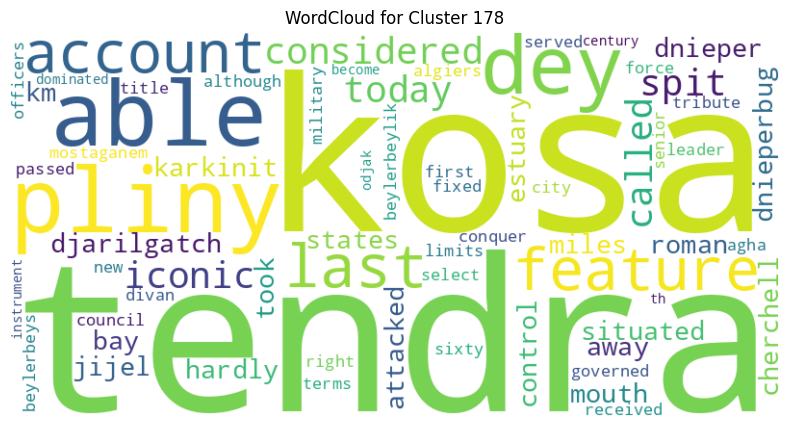


--- Cluster 179 (size=47) ---
• Alabama () is a state in the Southeastern region of the United States, bordered by Tennessee to the north; Georgia to the east; Florida and the Gulf of Mexico to the south; and Mississippi to the west.
• Alabama is the 30th largest by area and the 24th-most populous of the U.S. states.
• Alabama is nicknamed the Yellowhammer State, after the state bird.
• Alabama is also known as the "Heart of Dixie" and the "Cotton State".
• Alabama's capital is Montgomery, and its largest city by population and area is Huntsville.


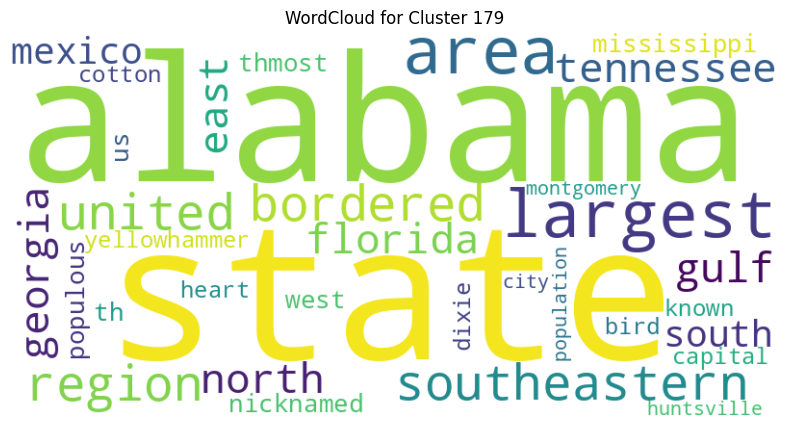


=== Bin 2 Range [0.05, 0.10) ===

--- Cluster 176 (size=60) ---
• The category's original name was Best Art Direction, but was changed to its current name in 2012 for the 85th Academy Awards.
• The films below are listed with their production year (for example, the 2000 Academy Award for Best Art Direction is given to a film from 1999).
• In the lists below, the winner of the award for each year is shown first, followed by the other nominees in alphabetical order.
• They are presented annually by the Academy of Motion Picture Arts and Sciences located in Beverly Hills, California, United States, in recognition of excellence in cinematic achievements as assessed by the Academy's voting membership.
• The major award categories are presented during a live televised Hollywood ceremony that is typically held in February or March.


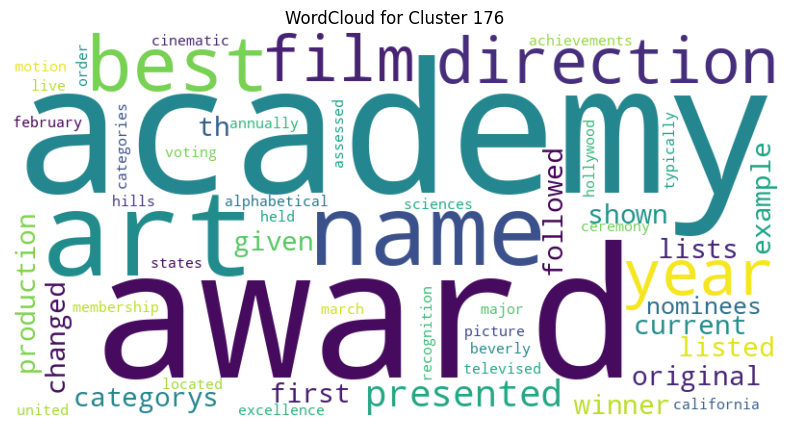


--- Cluster 177 (size=81) ---
• The Ottoman Empire extended the name of al-Jazā'ir over the entire country, deriving it from the name of the capital city.
• From their principal center of power at Carthage, the Carthaginians expanded and established small settlements along the North African coast; by 600 BC, a Phoenician presence existed at Tipasa, east of Cherchell, Hippo Regius (modern Annaba) and Rusicade (modern Skikda).
• These settlements served as market towns as well as anchorages.
• Berber civilisation was already at a stage in which agriculture, manufacturing, trade, and political organisation supported several states.
• Trade links between Carthage and the Berbers in the interior grew, but territorial expansion also resulted in the enslavement or military recruitment of some Berbers and in the extraction of tribute from others.


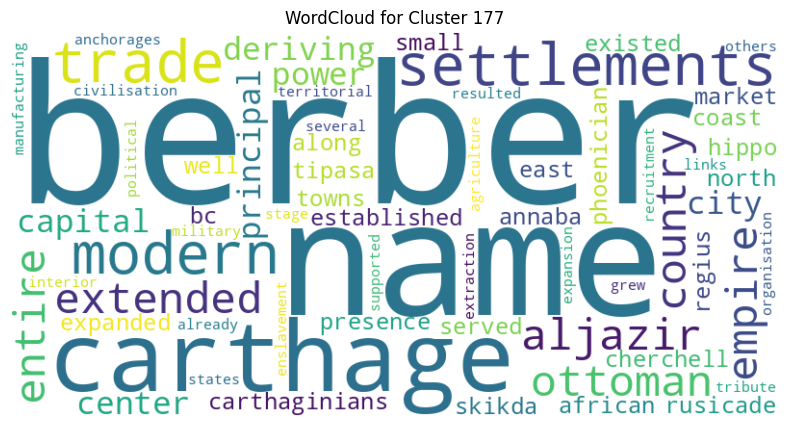


=== Bin 3 Range [0.10, 0.15) ===

--- Cluster 166 (size=33) ---
• On January 30, 1846, the Alabama legislature announced it had voted to move the capital city from Tuscaloosa to Montgomery.
• The first community of adherents of the Baháʼí Faith in Alabama was founded in 1896 by Paul K. Dealy, who moved from Chicago to Fairhope.
• Mobile is known for having the oldest organized Mardi Gras celebration in the United States, beginning in 1703.
• Wanting to go down fighting, he charges at Achilles with his only weapon, his sword, but misses.
• Lincoln was born into poverty in a log cabin in Kentucky and was raised on the frontier, primarily in Indiana.


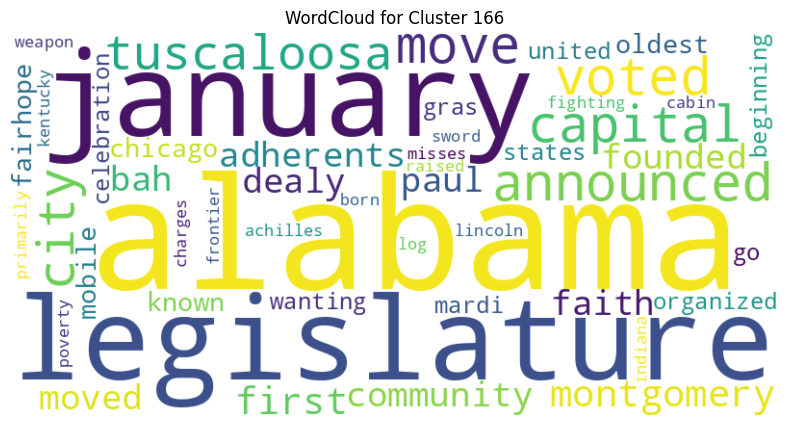


--- Cluster 167 (size=55) ---
• Among these were the semicursive minuscule of Italy, the Merovingian script in France, the Visigothic script in Spain, and the Insular or Anglo-Irish semi-uncial or Anglo-Saxon majuscule of Great Britain.
• Alabama English is predominantly Southern, and is related to South Midland speech which was taken across the border from Tennessee.
• French also serves as an administrative and educational language in some contexts, but it has no official status.
• The mixture of peoples of North Africa coalesced eventually into a distinct native population that came to be called Berbers, who are the indigenous peoples of northern Africa.
• The Berber people historically consisted of several tribes.


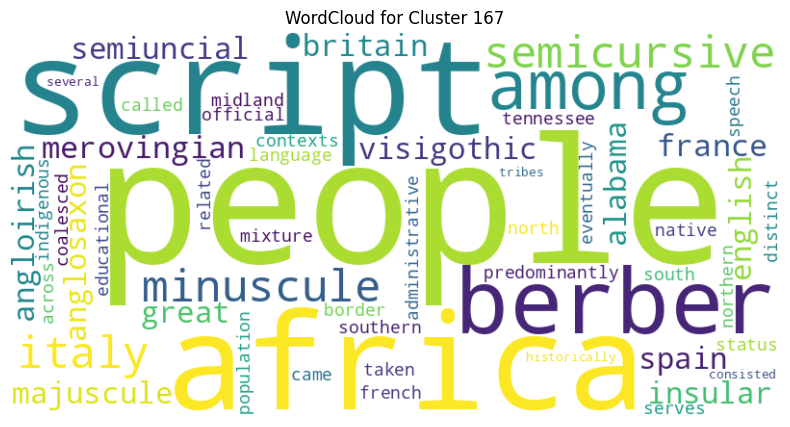


=== Bin 4 Range [0.15, 0.20) ===

--- Cluster 148 (size=26) ---
• It is measured on a scale from 0 (corresponding to a black body that absorbs all incident radiation) to 1 (corresponding to a body that reflects all incident radiation).
• The proportion reflected is not only determined by properties of the surface itself, but also by the spectral and angular distribution of solar radiation reaching the Earth's surface.
• This spectrum includes visible light (0.4–0.7 μm), which explains why surfaces with a low albedo appear dark (e.g., trees absorb most radiation), whereas surfaces with a high albedo appear bright (e.g., snow reflects most radiation).
• The average albedo of the Earth from the upper atmosphere, its planetary albedo, is 30–35% because of cloud cover, but widely varies locally across the surface because of different geological and environmental features.
• Deeply shadowed cavities can achieve an effective albedo approaching the zero of a black body.


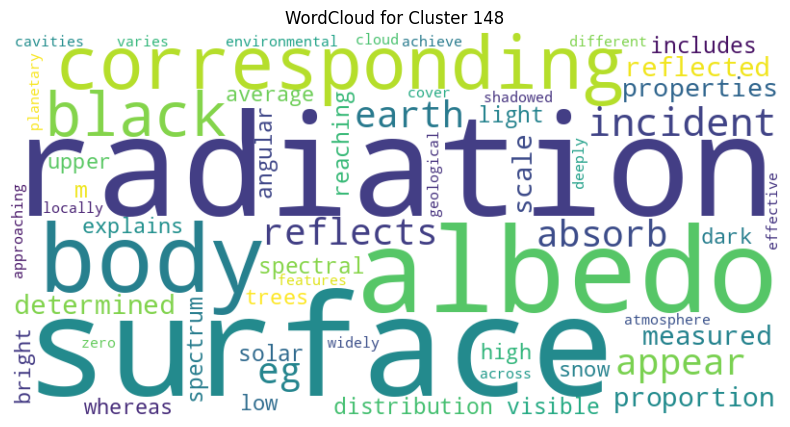


--- Cluster 149 (size=35) ---
• Buddhism, Christianity, Hinduism, Islam, Jainism, Judaism, and Sikhism, etc., place particular emphasis on altruistic morality.
• Buddhism

Altruism figures prominently in Buddhism.
• Love and compassion are components of all forms of Buddhism, and are focused on all beings equally: love is the wish that all beings be happy, and compassion is the wish that all beings be free from suffering.
• In the context of larger ethical discussions on moral action and judgment, Buddhism is characterized by the belief that negative (unhappy) consequences of our actions derive not from punishment or correction based on moral judgment, but from the law of karma, which functions like a natural law of cause and effect.
• Jainism

The fundamental principles of Jainism revolve around altruism, not only for humans but for all sentient beings.


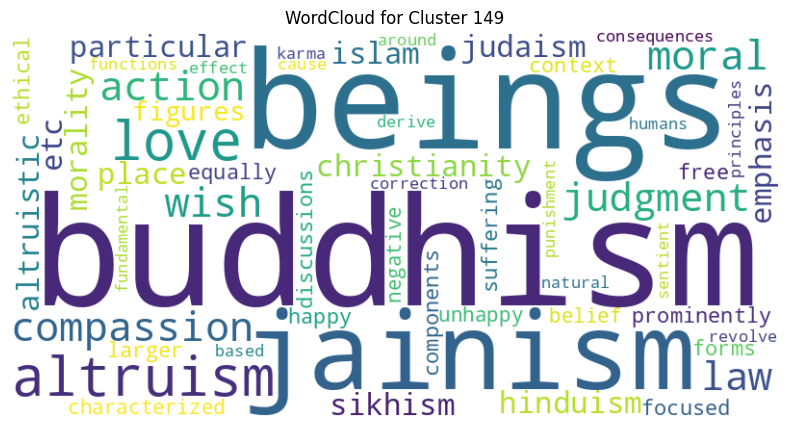


=== Bin 5 Range [0.20, 0.25) ===

--- Cluster 126 (size=23) ---
• Construction 
Brasfield & Gorrie, BE&K, Hoar Construction, and B.L.
• In Il Mito Greco, edd.
• Shortly after, a Mille Lacs Band Chief offered the same at St.
• [Reprinted in J. Barnes, M. Schofield, and R.R.K.
• Actresses (Catalan: Actrius) is a 1997 Catalan language Spanish drama film produced and directed by Ventura Pons and based on the award-winning stage play E.R.


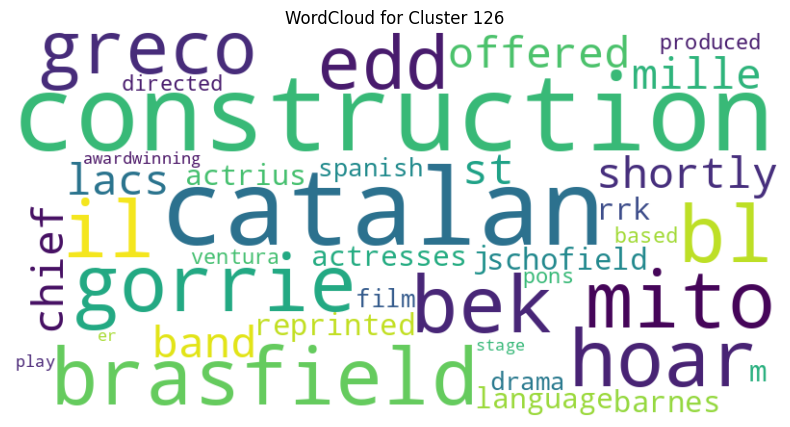


--- Cluster 127 (size=36) ---
• A follow-up study found that "CO2-eq.
• The original Oscar mold was cast in 1928 at the C.W.
• From 1983 to 2015, approximately 50 Oscars in a tin alloy with gold plating were made each year in Chicago by Illinois manufacturer R.S.
• The R.S.
• This followed the win of O.J.


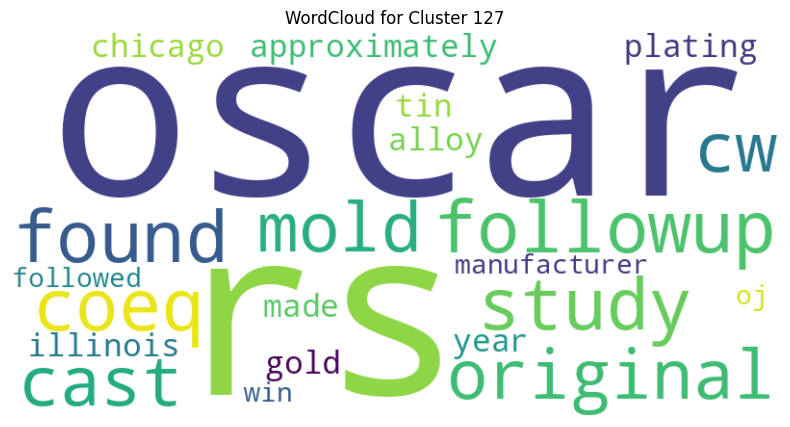


=== Bin 6 Range [0.25, 0.30) ===

--- Cluster 99 (size=129) ---
• This coincided with its failure to gain traction in Northern Europe and its unprecedented height in Latin America.
• A significant event of this period was the confrontations at the 1999 Seattle WTO conference.
• Many of these attacks were done by individual assailants and the majority took place in the late 1870s, the early 1880s and the 1890s, with some still occurring in the early 1900s.
• Their decrease in prevalence was the result of further judicial power and targeting and cataloging by state institutions.
• Members of The Invisible Committee were arrested in 2008 on various charges, terrorism included.


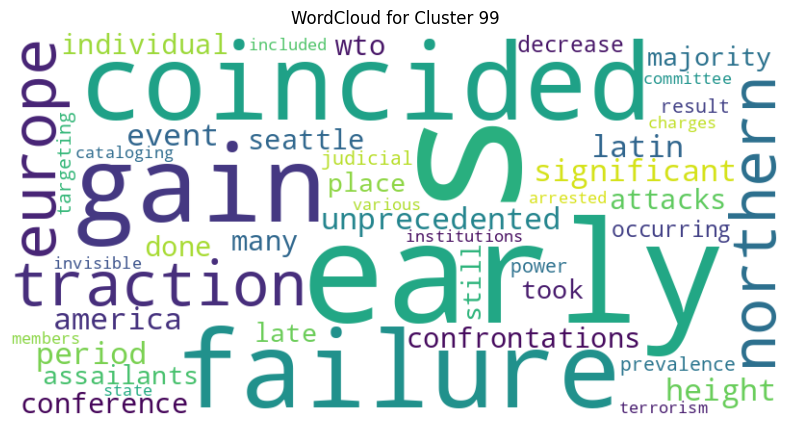


--- Cluster 100 (size=79) ---
• Organized insurgent, resistance groups tried to suppress the freedmen and Republicans.
• Provisions which disenfranchised blacks resulted in excluding many poor Whites.
• Lincoln ran for president in 1860, sweeping the North to gain victory.
• During this time, the newly formed Confederate States of America began seizing federal military bases in the South.
• His allies, the War Democrats and the Radical Republicans, demanded harsh treatment of the Southern Confederates.


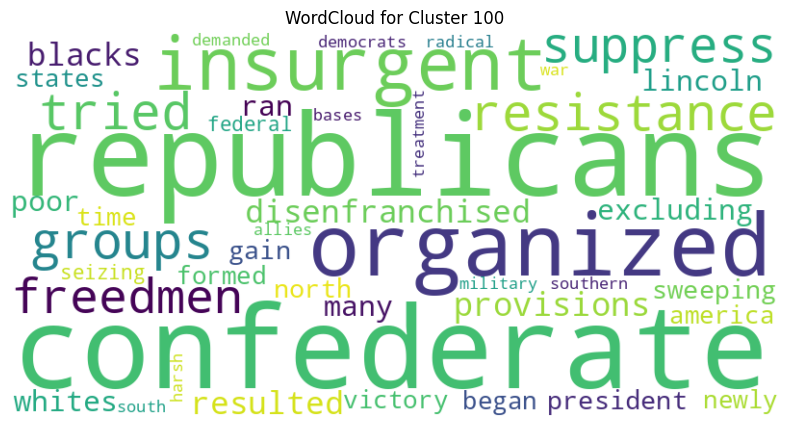


=== Bin 7 Range [0.30, 0.35) ===

--- Cluster 74 (size=31) ---
• These protists live as individual amoebae until starved, at which point they aggregate and form a multicellular fruiting body in which some cells sacrifice themselves to promote the survival of other cells in the fruiting body.
• Reptiles, birds and mammals are amniotes, the eggs of which are either laid or carried by the female and are surrounded by several membranes, some of which are impervious.
• Amphibians that lay eggs on land often go through the whole metamorphosis inside the egg.
• An anamniotic terrestrial egg is less than 1 cm in diameter due to diffusion problems, a size which puts a limit on the amount of posthatching growth.
• The hearts of amphibians have three chambers, two atria and one ventricle.


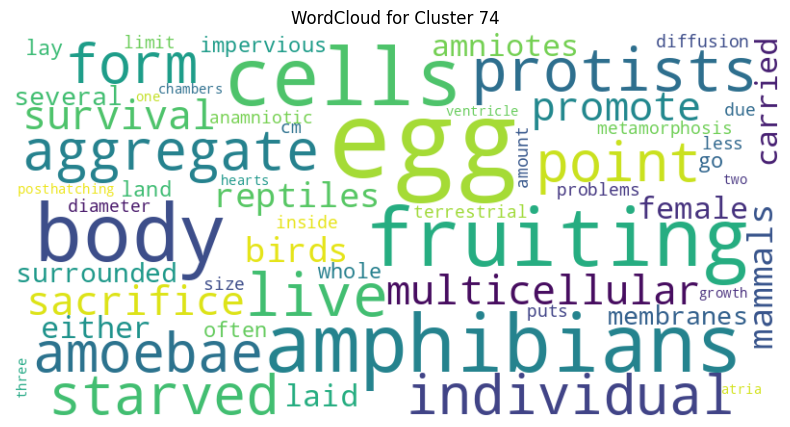


--- Cluster 75 (size=27) ---
• He said the Kansas Act had a "declared indifference, but as I must think, a covert real zeal for the spread of slavery.
• Historian David Herbert Donald described the speech as "a superb political move for an unannounced presidential aspirant.
• By the end of the war, he increasingly appealed to the Almighty for solace and to explain events, writing on April 4, 1864, to a newspaper editor in Kentucky: This spirituality can best be seen in his second inaugural address, considered by some scholars as the greatest such address in American history, and by Lincoln himself as his own greatest speech, or one of them at the very least.
• After his initial student audition with Ravel turned into a sharing of musical theories, Ravel said he could not teach him, saying, "Why be a second-rate Ravel when you can be a first-rate Gershwin?"
• Later, evidence arose suggesting that Opel's appearance was facilitated as a publicity stunt by the show's producer Jack Haley J

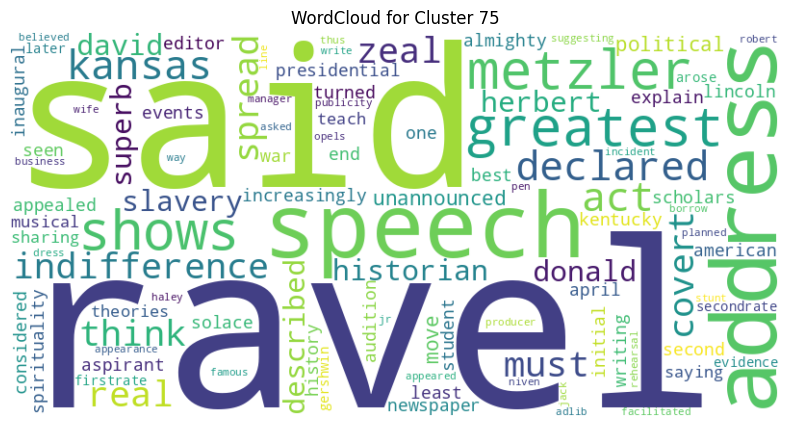


=== Bin 8 Range [0.35, 0.40) ===

--- Cluster 51 (size=19) ---
• Agassi reached the world No.
• Agassi returned to No.
• By the end of 1986, Agassi was ranked No.
• He won his first top-level singles title in 1987 at the Sul American Open in Itaparica and ended the year ranked No.
• His year-end ranking was No.


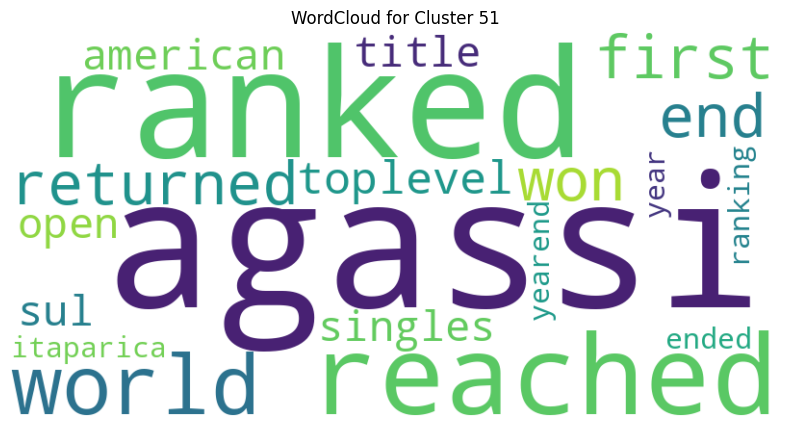


--- Cluster 52 (size=29) ---
• 171.
• 2017.
• 19.
• Gr.
• 340.


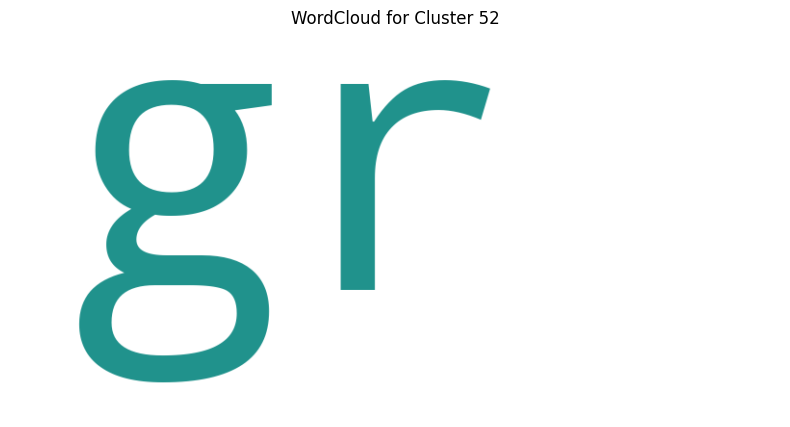


=== Bin 9 Range [0.40, 0.45) ===

--- Cluster 30 (size=61) ---
• Major definitional elements include the will for a non-coercive society, the rejection of the state apparatus, the belief that human nature allows humans to exist in or progress toward such a non-coercive society, and a suggestion on how to act to pursue the ideal of anarchy.
• Instead, they are trying to build an alternative way of social organization, based on mutual interdependence and voluntary cooperation.
• Scholar Carissa Honeywell takes the example of Food not Bombs group of collectives, to highlight some features of how anarchist groups work: direct action, working together and in solidarity with those left behind.
• Honeywell also emphasizes that contemporary anarchists are interested in the flourishing not only of humans, but non-humans and the environment as well.
• Honeywell argues that escalation of problems such as continuous wars and world poverty show that the current framework not only cannot solve thos

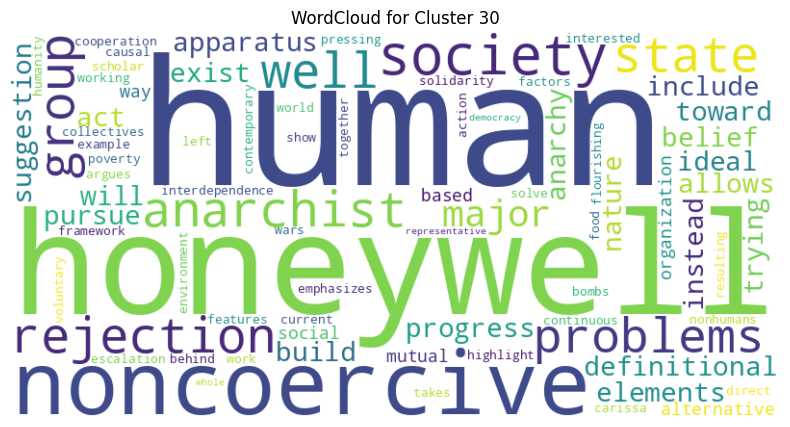


--- Cluster 31 (size=76) ---
• The score to An American in Paris was scheduled to be issued first in a series of scores to be released.
• The entire project was expected to take 30 to 40 years to complete, but An American in Paris was planned to be an early volume in the series.
• Reception 
In Movie - Film - Review, Christopher Tookey wrote that though the actresses were "competent in roles that may have some reference to their own careers", the film "is visually unimaginative, never escapes its stage origins, and is almost totally lacking in revelation or surprising incident".
• Noting that there were "occasional, refreshing moments of intergenerational bitchiness", they did not "justify comparisons to All About Eve", and were "insufficiently different to deserve critical parallels with Rashomon".
• He also wrote that The Guardian called the film a "slow, stuffy chamber-piece", and that The Evening Standard stated the film's "best moments exhibit the bitchy tantrums seething beneath

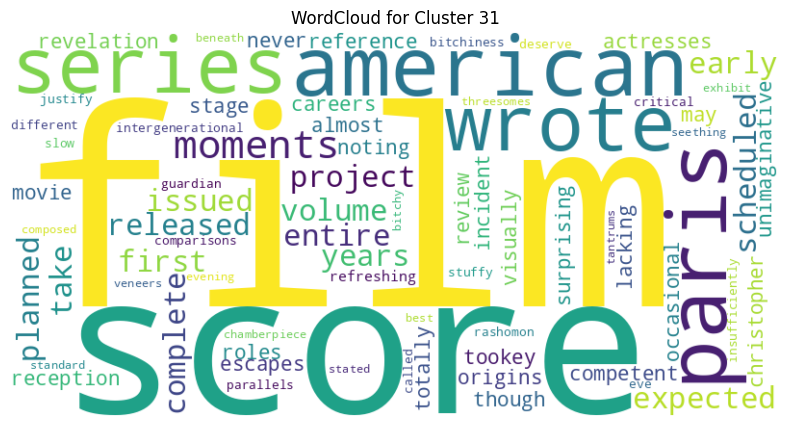


=== Bin 10 Range [0.45, 0.50) ===

--- Cluster 16 (size=44) ---
• Aeschylus and Sophocles used the myth of Antigone to illustrate the conflict between laws imposed by the state and personal autonomy.
• Socrates uses various analogies, discussing athletics and the sciences to prove his point.
• Aristotle provided a complex synthesis of the various philosophies existing prior to him.
• Aristotle encouraged Alexander toward eastern conquest, and Aristotle's own attitude towards Persia was unabashedly ethnocentric.
• Aristotle studied and made significant contributions to "logic, metaphysics, mathematics, physics, biology, botany, ethics, politics, agriculture, medicine, dance, and theatre."


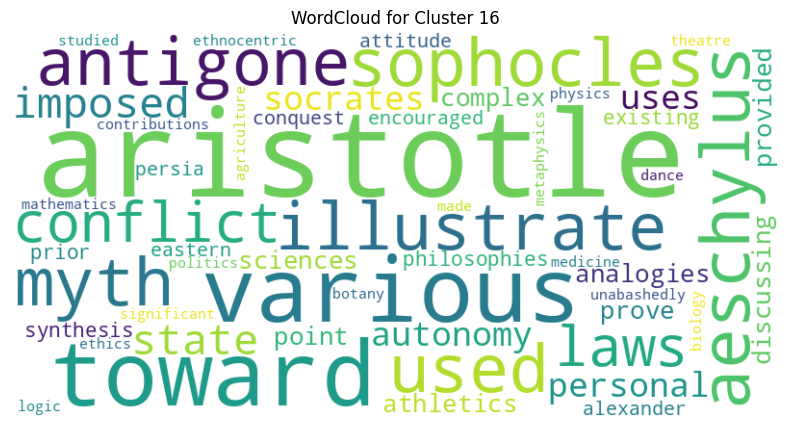


--- Cluster 17 (size=80) ---
• Lastly, Fiala mentions a critique towards philosophical anarchism of being ineffective (all talk and thoughts) and in the meantime capitalism and bourgeois class remains strong.
• With this derivation, the name obtains a double meaning in the poem: when the hero is functioning rightly, his men bring distress to the enemy, but when wrongly, his men get the grief of war.
• The poem is in part about the misdirection of anger on the part of leadership.
• Achilles' wrath (μῆνις Ἀχιλλέως, mênis Achilléōs) is the central theme of the poem.
• It begins with Achilles' withdrawal from battle after being dishonoured by Agamemnon, the commander of the Achaean forces.


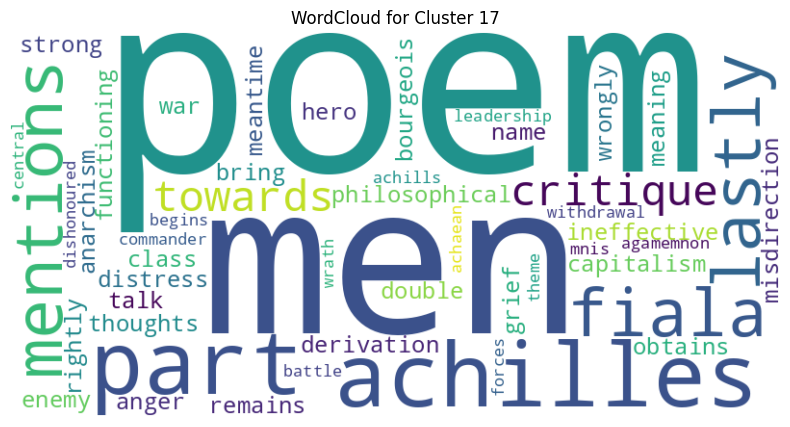


=== Bin 11 Range [0.50, 0.55) ===

--- Cluster 13 (size=45) ---
• Hence, the Ain Boucherit evidence shows that ancestral hominins inhabited the Mediterranean fringe in northern Africa much earlier than previously thought.
• Sidwell & Blench (2011) discuss this proposal in more detail, and note that there is good evidence for a Khasi–Palaungic node, which could also possibly be closely related to Khmuic.
• If this would the case, Sidwell & Blench suggest that Khasic may have been an early offshoot of Palaungic that had spread westward.
• In general, however, the family is thought to have diversified too quickly for a deeply nested structure to have developed, since Proto-Austroasiatic speakers are believed by Sidwell to have radiated out from the central Mekong river valley relatively quickly.
• A subsequent computational phylogenetic analysis (Sidwell 2015b) suggests that Austroasiatic branches may have a loosely nested structure rather than a completely rake-like structure, with an e

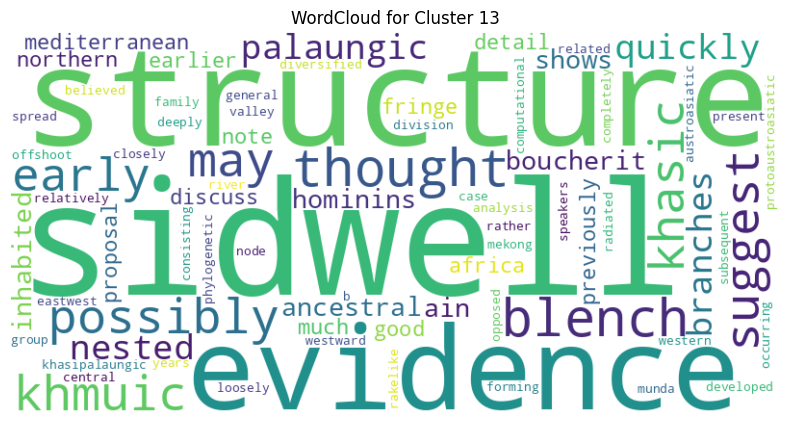


--- Cluster 14 (size=65) ---
• Other names 
Among the appellations under which Achilles is generally known are the following:
 Pyrisous, "saved from the fire", his first name, which seems to favour the tradition in which his mortal parts were burned by his mother Thetis
 Aeacides, from his grandfather Aeacus
 Aemonius, from Aemonia, a country which afterwards acquired the name of Thessaly
 Aspetos, "inimitable" or "vast", his name at Epirus
 Larissaeus, from Larissa (also called Cremaste), a town of Achaia Phthiotis in Thessaly
 Ligyron, his original name
 Nereius, from his mother Thetis, one of the Nereids
 Pelides, from his father, Peleus
 Phthius, from his birthplace, Phthia
 Podarkes, "swift-footed" (literally, "defending with the foot," from the verb ἀρκέω, "to defend, ward off"); Ptolemy Hephaestion, alternatively, says that it was due to the wings of Arke being attached to his feet.
• During the cremation of Patroclus, he is compared to Hesperus, the evening/western star (Venus

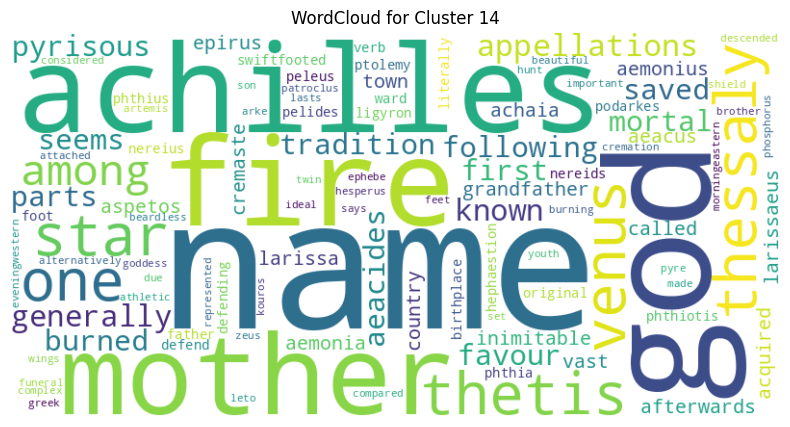


=== Bin 12 Range [0.55, 0.60) ===

--- Cluster 10 (size=56) ---
• Greater Birmingham is Alabama's largest metropolitan area and its economic center.
• NASA's Marshall Space Flight Center in Huntsville would help Alabama's economic growth in the mid-to-late 20th century, by developing an aerospace industry.
• Alabama's economy in the 21st century is based on automotive, finance, tourism, manufacturing, aerospace, mineral extraction, healthcare, education, retail, and technology.
• The state's geography is diverse, with the north dominated by the mountainous Tennessee Valley and the south by Mobile Bay, a historically significant port.
• Politically, as part of the Deep South, Alabama is predominantly a conservative state, and is known for its Southern culture.


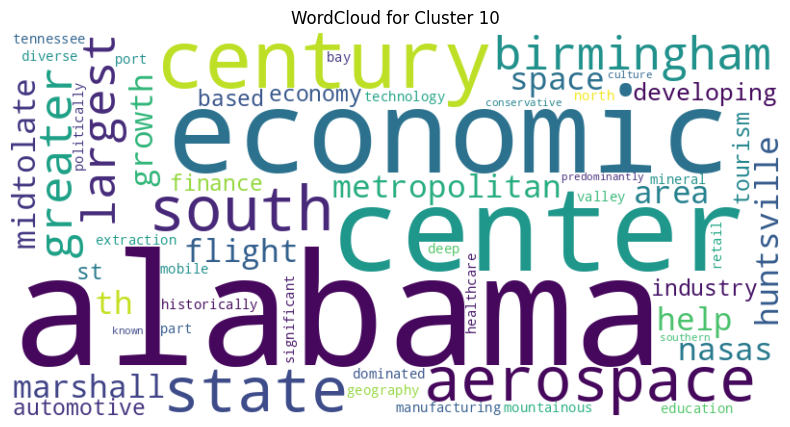


--- Cluster 11 (size=68) ---
• The state has numerous place names of Native American origin.
• This area was claimed by the French from 1702 to 1763 as part of La Louisiane.
• A few natural disasters have occurred in the state in the twenty-first century.
• A -wide meteorite impact crater is located in Elmore County, just north of Montgomery.
• This is the Wetumpka crater, the site of "Alabama's greatest natural disaster".


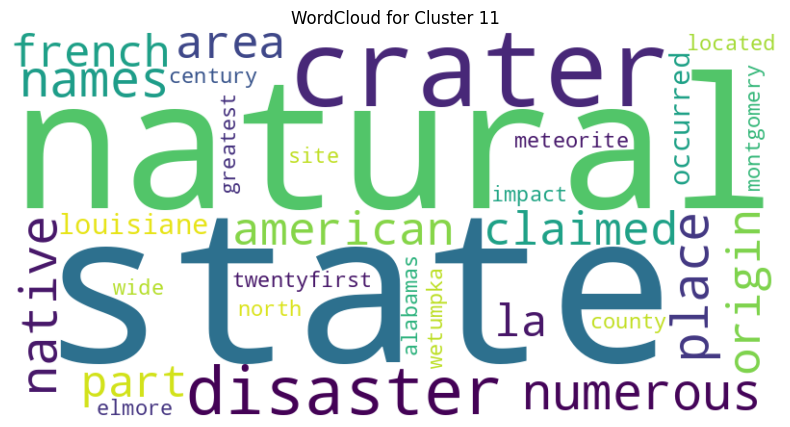


=== Bin 13 Range [0.60, 0.65) ===

--- Cluster 9 (size=43) ---
• 21st century 
In 2001, Alabama Supreme Court chief justice Roy Moore installed a statue of the Ten Commandments in the capitol in Montgomery.
• Lincoln led the Union through the American Civil War to defend the nation as a constitutional union and succeeded in defeating the insurgent Confederacy, abolishing slavery, expanding the power of the federal government, and modernizing the U.S. economy.
• Lincoln is remembered as a martyr and a national hero for his wartime leadership and for his efforts to preserve the Union and abolish slavery.
• Lincoln is often ranked in both popular and scholarly polls as the greatest president in American history.
• In the aftermath of the 1858 election, newspapers frequently mentioned Lincoln as a potential Republican presidential candidate, rivaled by William H. Seward, Salmon P. Chase, Edward Bates, and Simon Cameron.


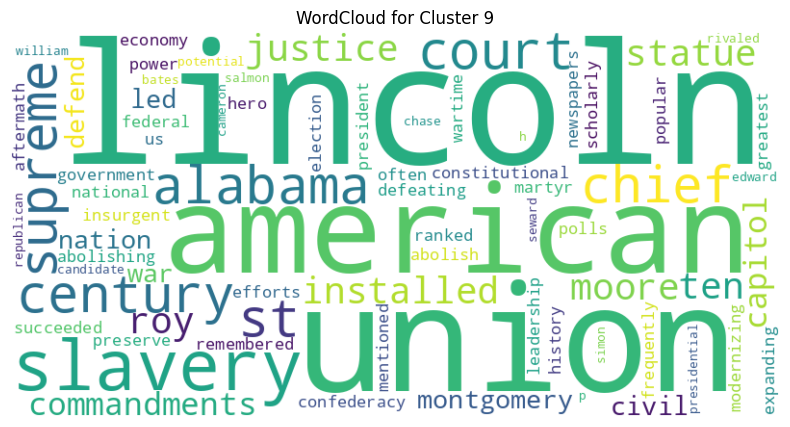


=== Bin 14 Range [0.65, 0.70) ===

--- Cluster 6 (size=35) ---
• 26: pp. 215–227.
• (2016), Themes of the Trojan Cycle: Contribution to the study of the greek mythological tradition (Coimbra).
• Handbook of Greek Philosophy: From Thales to the Stoics Analysis and Fragments, Trafford Publishing, .
• Potentiality in Aristotle's Science and Metaphysics, Pacific Philosophical Quarterly 76.
• Aristotle's Empiricism: Experience and Mechanics in the 4th century BC, Parmenides Publishing, .


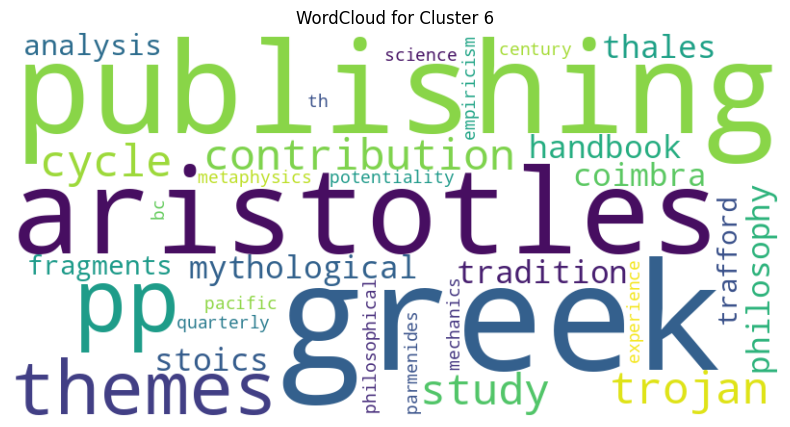


--- Cluster 7 (size=61) ---
• Use in film
In 1951, Metro-Goldwyn-Mayer released the musical film An American in Paris, featuring Gene Kelly and Leslie Caron and directed by Vincente Minnelli.
• Sculptor George Stanley (who also did the Muse Fountain at the Hollywood Bowl) sculpted Cedric Gibbons' design.
• It took until 2023 for an Asian woman to win an Academy Award for Best Actress, when Michelle Yeoh received the award for her performance in Everything Everywhere All at Once.
• Another example is Once Upon a Time in Hollywood (2019), where Brad Pitt was nominated for and won Best Supporting Actor, even though he played an equally important role to Best Actor nominee Leonardo DiCaprio.
• H. N. Abrams also published a wall calendar colouring book version for children the same year.


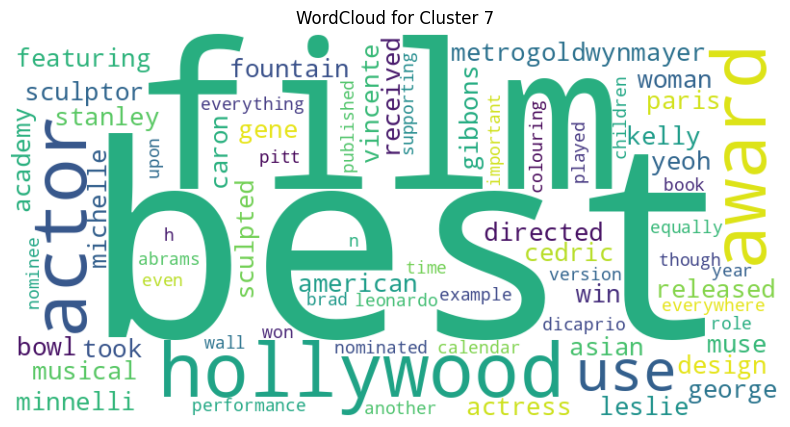


=== Bin 15 Range [0.70, 0.75) ===

--- Cluster 4 (size=53) ---
• Ice–albedo feedback plays an important role in global climate change.
• This may have both been co-caused by climate change as well as a substantial increase in global warming.
• However, the link to climate change has not been explored to date and it is unclear whether or not this represents an ongoing trend.
• Both positive feedback loops have long been recognized as important for global warming.
• Hunters who share meat display a costly signal of ability.


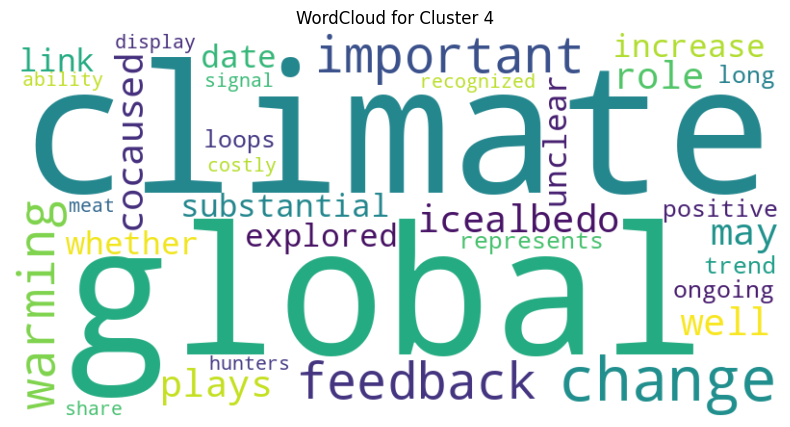


--- Cluster 5 (size=62) ---
• A new capitol building was erected under the direction of Stephen Decatur Button of Philadelphia.
• created a statue group Achilles and Penthesilea (1895; Vienna).
• He was self-educated and became a lawyer, Whig Party leader, Illinois state legislator, and U.S. congressman from Illinois.
• In 1849, he returned to his successful law practice in Springfield, Illinois.
• In 1854, he was angered by the Kansas–Nebraska Act, which opened the territories to slavery, causing him to re-enter politics.


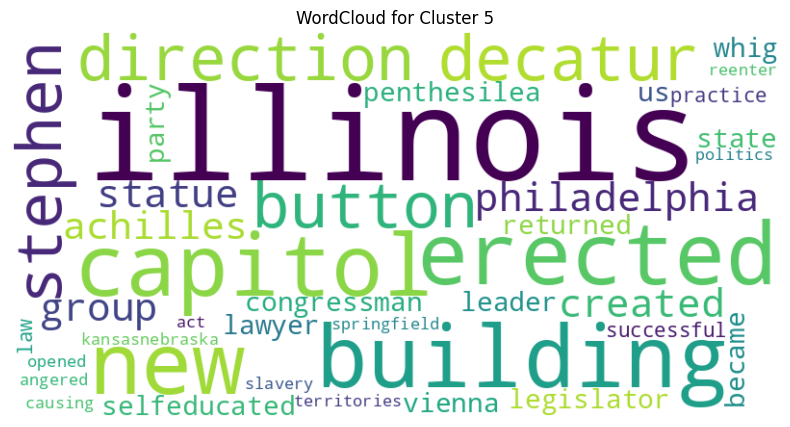


=== Bin 16 Range [0.75, 0.80) ===

--- Cluster 3 (size=79) ---
• One way is for an individual from the group to play the role of facilitator to help achieve a consensus without taking part in the discussion themselves or promoting a specific point.
• Such associations can have a motivating effect, as exposure to the letter A has been found to improve performance, when compared with other letters.
• Factors that can cause lower life expectancy are maternal mortality, suicide, and gun crimes.
• However, during sleep the impressions made throughout the day are noticed as there are no new distracting sensory experiences.
• This has led situations where a film has two or more co-leads, and one of these is submitted in a supporting category to avoid the two leads competing against each other, and to increase the film's chances of winning.


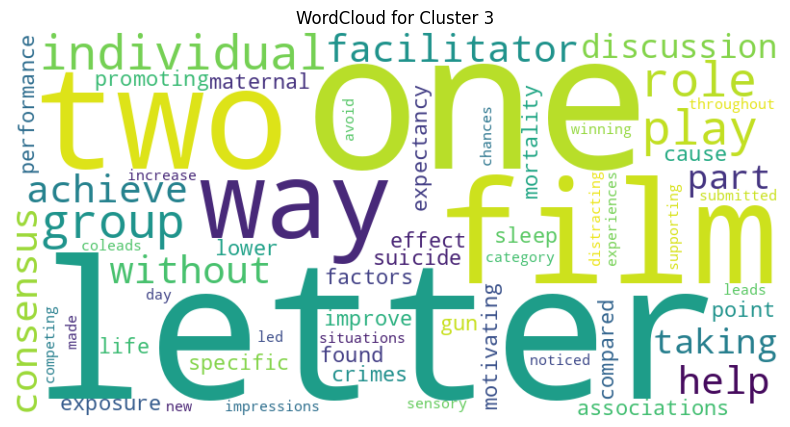


=== Bin 18 Range [0.85, 0.90) ===

--- Cluster 2 (size=142) ---
• In What Is Property?
• Those anarchists would rather base their thought and praxis on their own experience which they will later theorize.
• Three overlapping properties made art useful to anarchists.
• The tens of thousands of hectares of greenhouses in Almería, Spain form a large expanse of whitened plastic roofs.
• The glint of light off water is a commonplace effect of this.


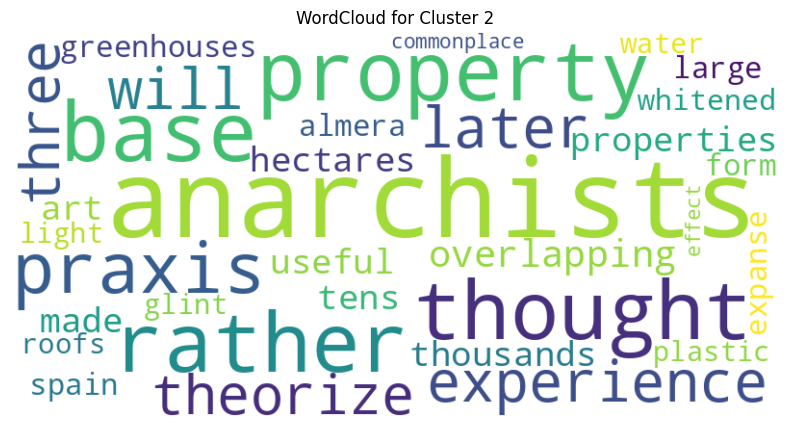


=== Bin 19 Range [0.90, 0.95) ===

--- Cluster 1 (size=102) ---
• Zeus and Poseidon had been rivals for Thetis's hand in marriage until Prometheus, the fore-thinker, warned Zeus of a prophecy (originally uttered by Themis, goddess of divine law) that Thetis would bear a son greater than his father.
• He was ambidextrous, and cast a spear from each hand; one grazed Achilles' elbow, "drawing a spurt of blood".
• Peleus entrusted Achilles to Chiron, who lived on Mount Pelion and was known as the most righteous of the Centaurs, to be reared.
• Achilles chose the former, and decided to take part in the Trojan War.
• Later Chiron exhumed the body of the Damysus, who was the fastest of all the giants, removed the ankle, and incorporated it into Achilles' burnt foot.


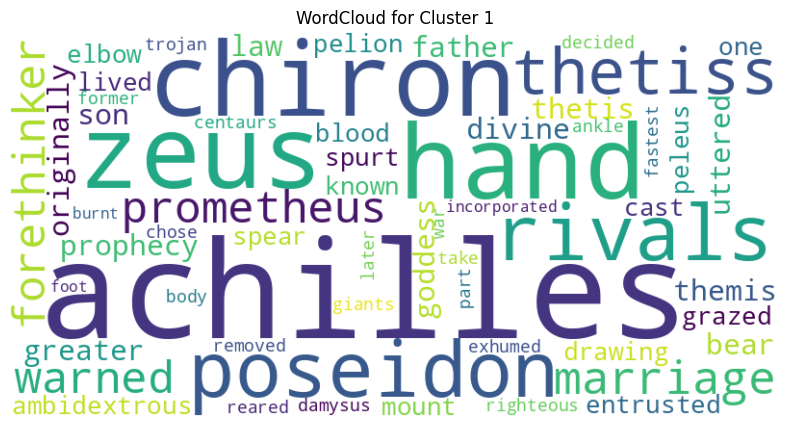

In [80]:
analyze_bins(general_sentences, gene_final_cluster, gene_final_group_counts_kmeans)


=== Bin 1 Range [0.00, 0.05) ===

--- Cluster 178 (size=45) ---
• Aquaculture 

Aquaculture is a large part of the economy of Alabama.
• The legislative branch is the Alabama Legislature, a bicameral assembly composed of the Alabama House of Representatives, with 105 members, and the Alabama Senate, with 35 members.
• The current chief justice of the Alabama Supreme Court is Republican Tom Parker.
• All sitting justices on the Alabama Supreme Court are members of the Republican Party.
• The Alabama Alcoholic Beverage Control Board controls the sale and distribution of alcoholic beverages in the state.


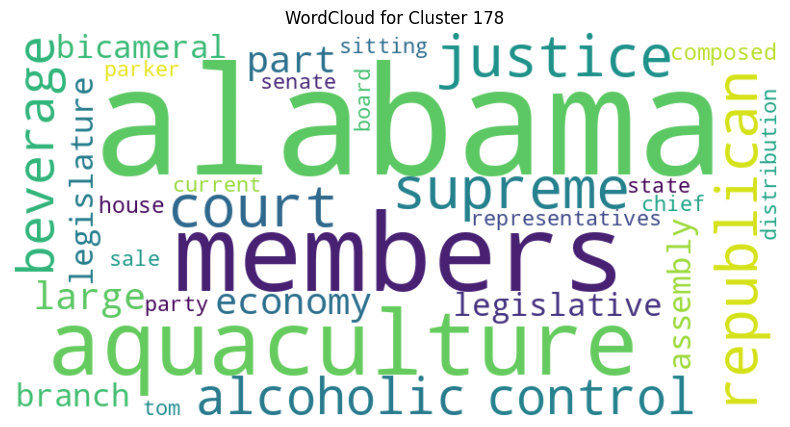


--- Cluster 179 (size=58) ---
• Humans have lived in societies without formal hierarchies long before the establishment of states, realms, or empires.
• Contemporary news coverage which emphasizes black bloc demonstrations has reinforced anarchism's historical association with chaos and violence.
• Anarchists usually form small groups (5–20 individuals) to enhance autonomy and friendships among their members.
• Anarchists have found it easier to create websites because of distributional and other difficulties, hosting electronic libraries and other portals.
• Arctic regions notably release more heat back into space than what they absorb, effectively cooling the Earth.


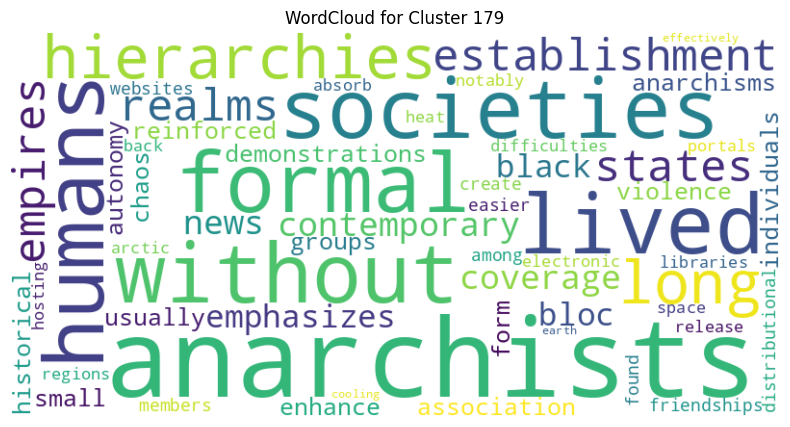


=== Bin 2 Range [0.05, 0.10) ===

--- Cluster 171 (size=101) ---
• Honeywell also emphasizes that contemporary anarchists are interested in the flourishing not only of humans, but non-humans and the environment as well.
• Honeywell argues that escalation of problems such as continuous wars and world poverty show that the current framework not only cannot solve those pressing problems for humanity, but are causal factors as well, resulting in the rejection of representative democracy and the state as a whole.
• Anarchists were also involved in developing various software that are available for free.
• Ferrer believed that moral indoctrination was necessary and explicitly taught pupils that equality, liberty and social justice were not possible under capitalism, along with other critiques of government and nationalism.
• Lastly, Fiala mentions a critique towards philosophical anarchism of being ineffective (all talk and thoughts) and in the meantime capitalism and bourgeois class remain

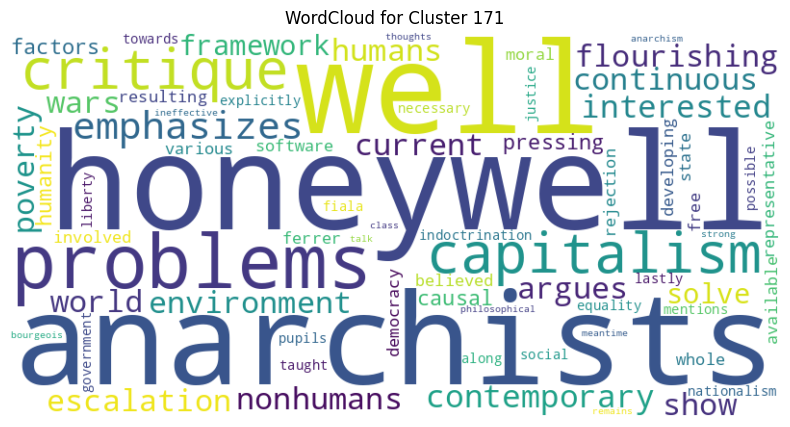


--- Cluster 172 (size=69) ---
• Unless given for a specific wavelength (spectral albedo), albedo refers to the entire spectrum of solar radiation.
• The lowercase version can be written in two forms: the double-storey a and single-storey ɑ.
• The known variants include the early semi-uncial, the uncial, and the later semi-uncial.
• The Italic form, also called script a, is used in most current handwriting; it consists of a circle and vertical stroke on the right ("ɑ").
• Graphic designers refer to the Italic and Roman forms as "single decker a" and "double decker a" respectively.


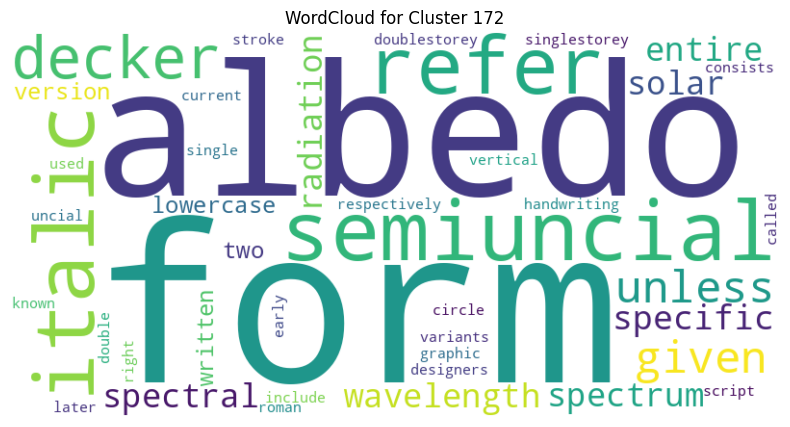


=== Bin 3 Range [0.10, 0.15) ===

--- Cluster 163 (size=38) ---
• 2419; Holkhamicus 109) – Cosmas le Hiéromoine – Chrysopée, Paris, Les Belles Lettres, 2000.
• 65, no 130, 1990, p. 219–242.
• Barnes & Noble, 1970.
• Cambridge: Cambridge University Press, 2017, .
• University of Chicago Press, 2002.


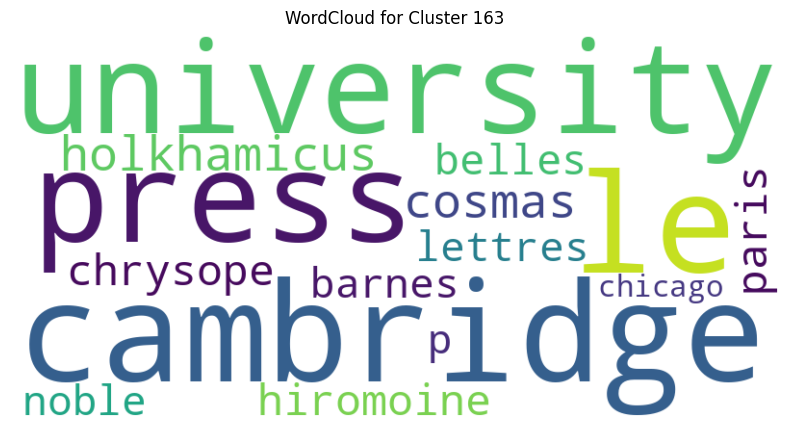


--- Cluster 164 (size=6) ---
• The hens – Unnamed.
• The cows – Unnamed.
• The cat – Unnamed and never seen to carry out any work.
• The ducks – Unnamed.
• The geese – Unnamed.


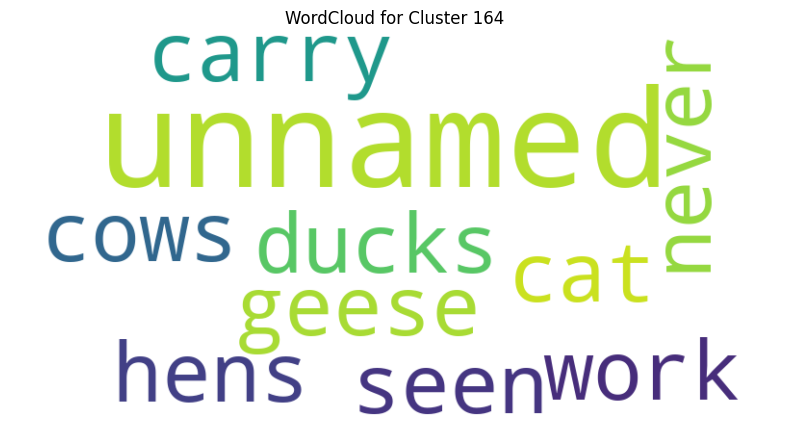


=== Bin 4 Range [0.15, 0.20) ===

--- Cluster 152 (size=112) ---
• Tokyo was a hotspot for rebellious youth from East Asian countries, who moved to the Japanese capital to study.
• Illegalism was another strategy which some anarchists adopted during this period.
• They were followed by the major currents of social anarchism (collectivist, communist and syndicalist).
• Their decrease in prevalence was the result of further judicial power and targeting and cataloging by state institutions.
• Those anarchists also built communities which were based on friendship and were involved in the news media.


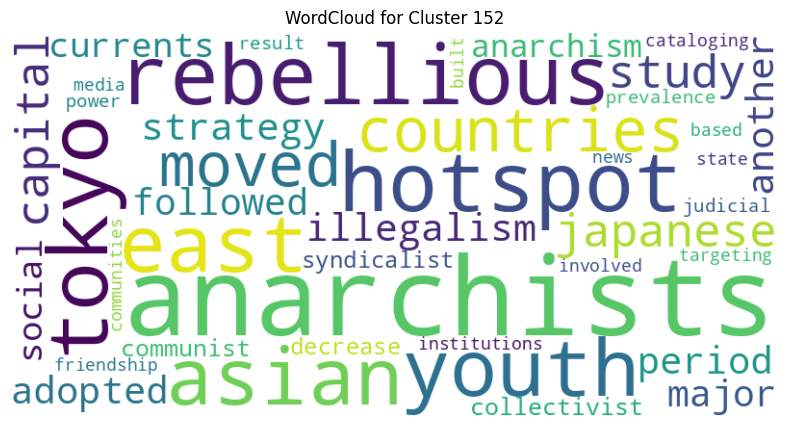


--- Cluster 153 (size=53) ---
• Although traces of anarchist ideas are found all throughout history, modern anarchism emerged from the Enlightenment.
• Anarchic attitudes were also articulated by tragedians and philosophers in Greece.
• Renewed interest in antiquity during the Renaissance and in private judgment during the Reformation restored elements of anti-authoritarian secularism, particularly in France.
• The first anarchist currents developed throughout the 18th century as William Godwin espoused philosophical anarchism in England, morally delegitimising the state, Max Stirner's thinking paved the way to individualism and Pierre-Joseph Proudhon's theory of mutualism found fertile soil in France.
• Anarcho-communists, who drew inspiration from the 1871 Paris Commune, advocated for free federation and for the distribution of goods according to one's needs.


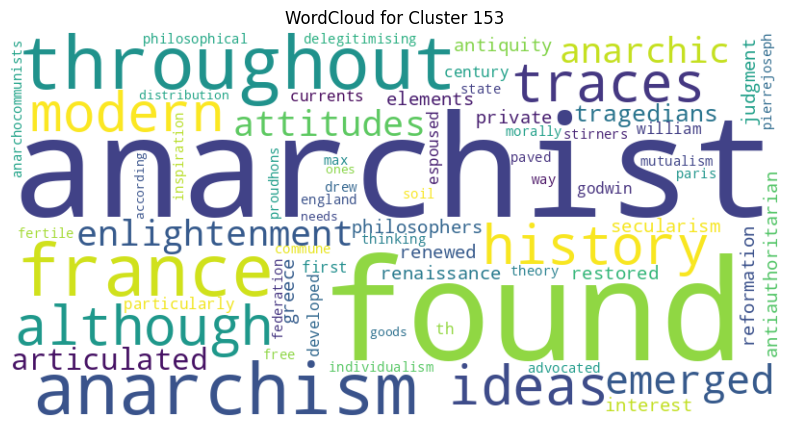


=== Bin 5 Range [0.20, 0.25) ===

--- Cluster 134 (size=67) ---
• Aeschylus and Sophocles used the myth of Antigone to illustrate the conflict between laws imposed by the state and personal autonomy.
• Bakunin's faction (the Jura Federation) and Proudhon's followers (the mutualists) opposed state socialism, advocating political abstentionism and small property holdings.
• Bakunin famously predicted that if revolutionaries gained power by Marx's terms, they would end up the new tyrants of workers.
• Robert Paul Wolff believed that the tension between authority and autonomy would mean the state could never be legitimate.
• A. John Simmons and Leslie Green, who leaned toward philosophical anarchism, believed that the state could be legitimate if it is governed by consensus, although they saw this as highly unlikely.


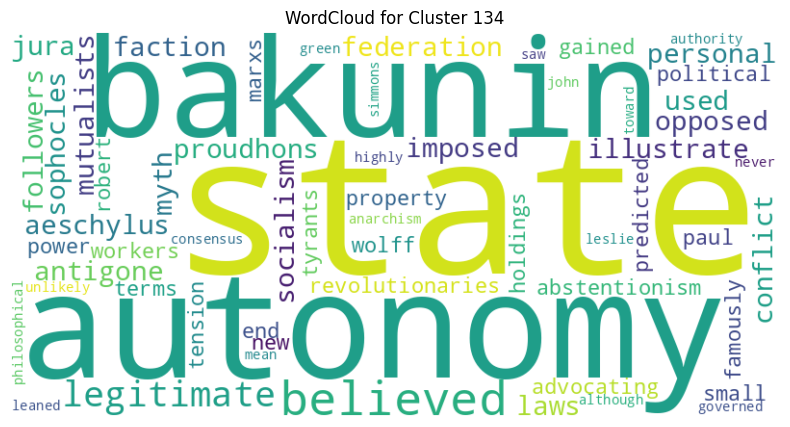


--- Cluster 135 (size=70) ---
• Tactics 
Anarchists' tactics take various forms but in general serve two major goals, namely, to first oppose the Establishment and secondly to promote anarchist ethics and reflect an anarchist vision of society, illustrating the unity of means and ends.
• Gender, sexuality, and free love 

As gender and sexuality carry along them dynamics of hierarchy, many anarchists address, analyse, and oppose the suppression of one's autonomy imposed by gender roles.
• Criticism 
The most common critique of anarchism is the assertion that humans cannot self-govern and so a state is necessary for human survival.
• White-sky, black-sky, and blue-sky albedo
For land surfaces, it has been shown that the albedo at a particular solar zenith angle θi can be approximated by the proportionate sum of two terms:
 the directional-hemispherical reflectance at that solar zenith angle, , sometimes referred to as black-sky albedo, and
 the bi-hemispherical reflectance, , sometimes

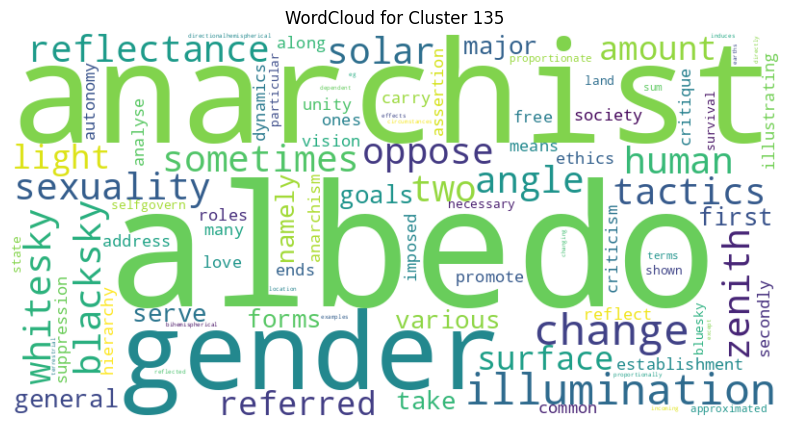


=== Bin 6 Range [0.25, 0.30) ===

--- Cluster 120 (size=69) ---
• Agamemnon refuses, and Apollo sends a plague amongst the Greeks.
• Achilles does so, and Calchas declares that Chryseis must be returned to her father.
• Agamemnon consents, but then commands that Achilles' battle prize Briseis, the daughter of Briseus, be brought to him to replace Chryseis.
• Angry at the dishonour of having his plunder and glory taken away (and, as he says later, because he loves Briseis), with the urging of his mother Thetis, Achilles refuses to fight or lead his troops alongside the other Greek forces.
• At the same time, burning with rage over Agamemnon's theft, Achilles prays to Thetis to convince Zeus to help the Trojans gain ground in the war, so that he may regain his honour.


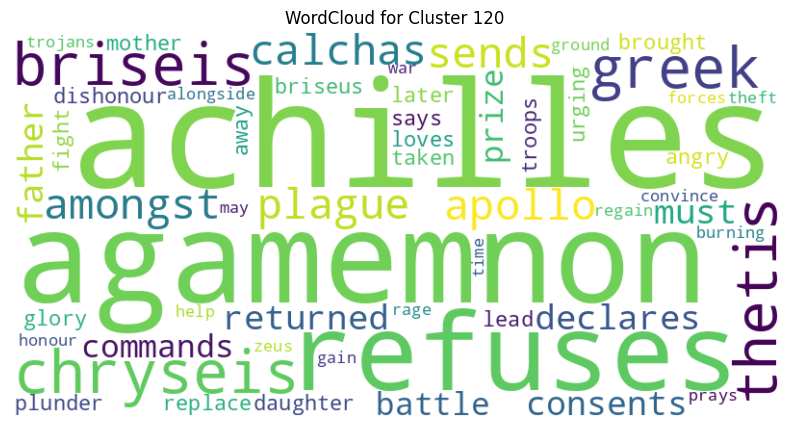


--- Cluster 121 (size=31) ---
• (p. 137)
  Anarchistic popular fiction novel.
• Beiträge zur klassischen Philologie.
• (2012) Reading Aristotle: Physics VII.
• 3: What is Alteration?
• (Starr Chester K. editor), The Origin, Variation, Immunity and Breeding of Cultivated Plants.


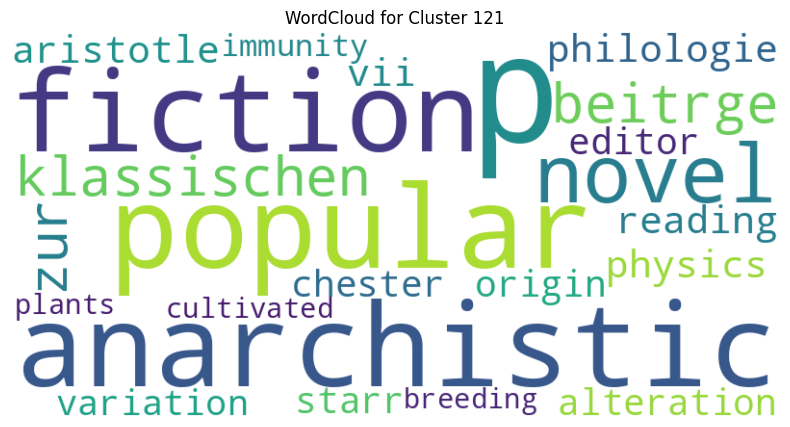


=== Bin 7 Range [0.30, 0.35) ===

--- Cluster 111 (size=75) ---
• Civil War and Reconstruction 

By 1860, the population had increased to 964,201 people, of which nearly half, 435,080, were enslaved African Americans, and 2,690 were free people of color.
• The civil rights movement had notable events in Alabama, including the Montgomery bus boycott (1955–1956), Freedom Rides in 1961, and 1965 Selma to Montgomery marches.
• , the three largest denominational groups in Alabama are the Southern Baptist Convention, The United Methodist Church, and non-denominational Evangelical Protestant.
• In Alabama, the Southern Baptist Convention has the highest number of adherents with 1,380,121; this is followed by the United Methodist Church with 327,734 adherents, non-denominational Evangelical Protestant with 220,938 adherents, and the Catholic Church with 150,647 adherents.
• The Presbyterian churches, strongly associated with Scots-Irish immigrants of the 18th century and their descendants, ha

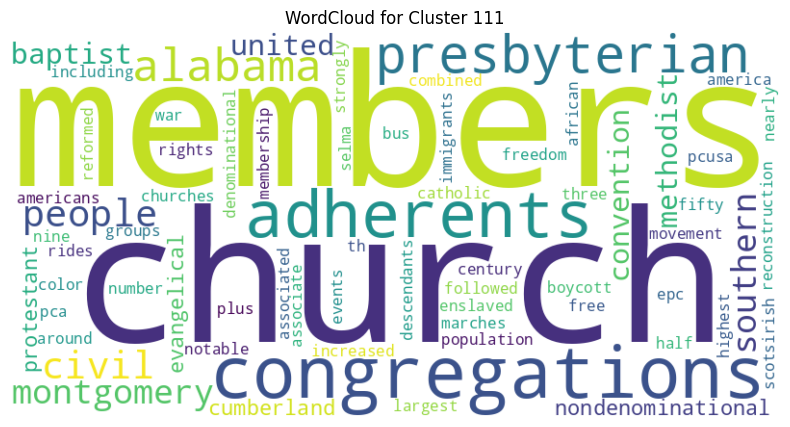


--- Cluster 112 (size=24) ---
• One he commuted for turning state's witness.
• 2, did not shift , (comma) or .
• (full stop) so they could be used in uppercase without unshifting).
• 1 tennis player.
• 3, behind second-ranked Ivan Lendl and top-ranked Mats Wilander.


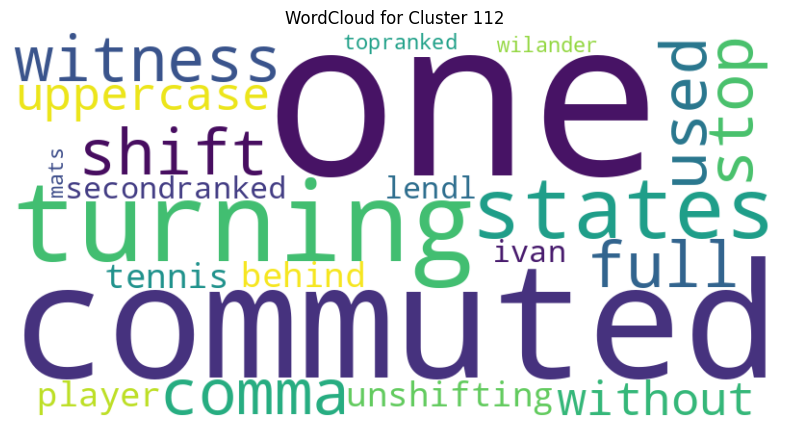


=== Bin 8 Range [0.35, 0.40) ===

--- Cluster 99 (size=29) ---
• Edward Baker Lincoln (Eddie), born in 1846, died February 1, 1850, probably of tuberculosis.
• Zann Gill describes how these two murders set off a chain reaction that ultimately prompted Abraham Lincoln to run for President.
• Michael Martinez wrote about the effective imaging of Lincoln by his campaign.
• Samuel Freeman Miller supported Lincoln in the 1860 election and was an avowed abolitionist.
• El Hadj M'Hamed El Anka is considered the greatest master of the art in modern times.


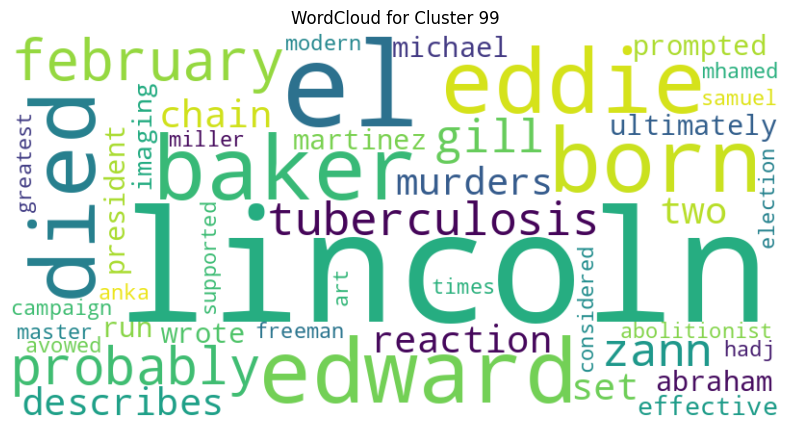


--- Cluster 100 (size=19) ---
• Shumway & Sons Foundry in Batavia, Illinois, which also contributed to casting the molds for the Vince Lombardi Trophy and Emmy Award statuettes.
• : Made in America, an eight-hour presentation that was screened in a limited release before being broadcast in five parts on ABC and ESPN, in that category in 2017.
• The Banu Hilal and the Banu Sulaym for example, who regularly disrupted farmers in the Nile Valley since the nomads would often loot their farms.
• Epactaeus, meaning "god worshipped on the coast", in Samos.
• A title given to Apollo at a shrine at Nettleton Shrub, Wiltshire.


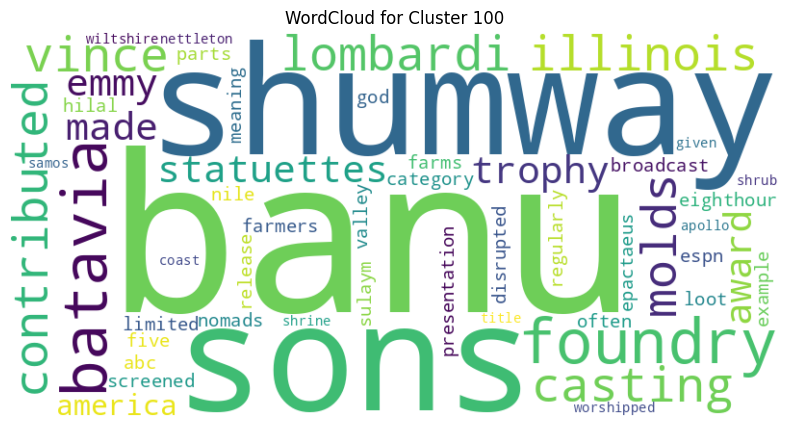


=== Bin 9 Range [0.40, 0.45) ===

--- Cluster 82 (size=8) ---
• ), Natali, Carlo (Ed.
• ); Recepte für Silber, Steine und Purpur, bearb.
• 2, and the ,< .> pairs were used on some keyboards (others, including the No.
• 1),  (Vol.
• 110 to No.


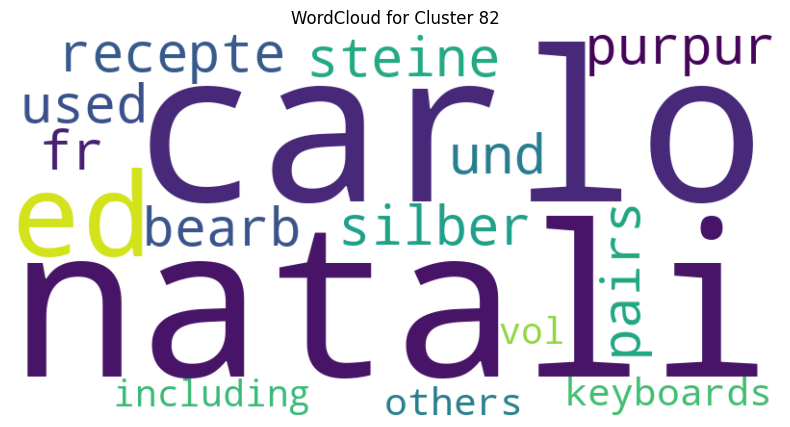


--- Cluster 83 (size=77) ---
• Assassination attempts were carried out against heads of state, some of which were successful.
• Anarchists also took part in revolutions.
• Anarchists took an active role in strike actions, although they tended to be antipathetic to formal syndicalism, seeing it as reformist.
• Anarchists also reinforced their propaganda within the arts, some of whom practiced naturism and nudism.
• As in the past, newspapers and journals are used, and anarchists have gone online in the World Wide Web to spread their message.


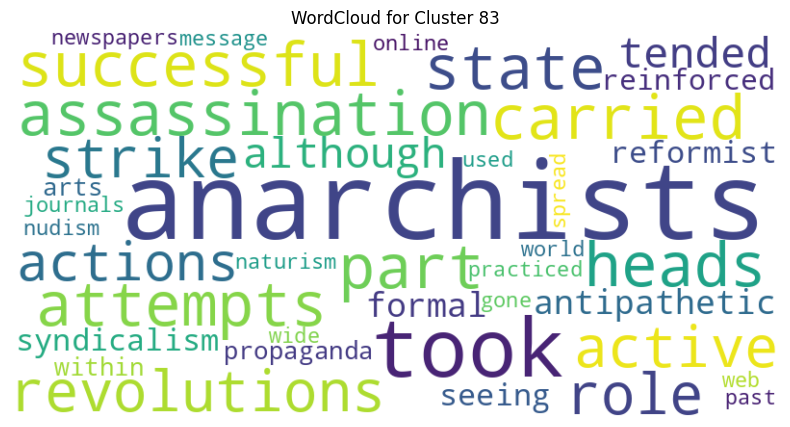


=== Bin 10 Range [0.45, 0.50) ===

--- Cluster 69 (size=113) ---
• The former sought to create a coherent group that would push for revolution while the latter were against anything that would resemble a political party.
• It also saw a transition from its previous revolutionary nature to provocative anti-capitalist reformism.
• This coincided with its failure to gain traction in Northern Europe and its unprecedented height in Latin America.
• (1840), Proudhon first characterised his goal as a "third form of society, the synthesis of communism and property."
• They saw it as a part of the movement which sought to overthrow the state and capitalism.


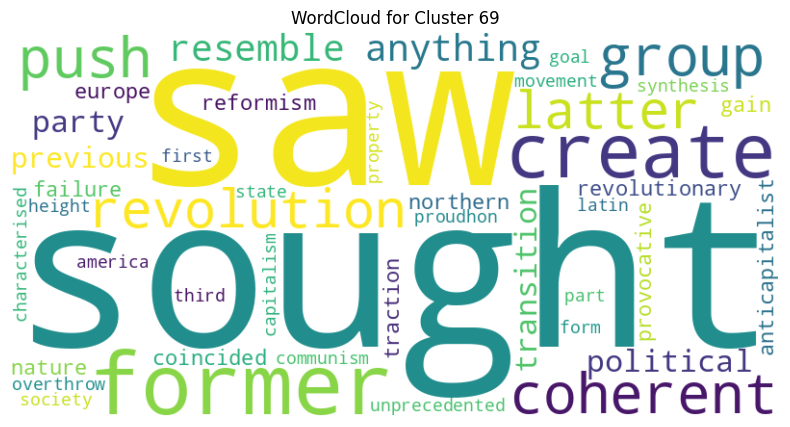


--- Cluster 70 (size=52) ---
• Its oldest city is Mobile, founded by French colonists (Alabama Creoles) in 1702 as the capital of French Louisiana.
• Greater Birmingham is Alabama's largest metropolitan area and its economic center.
• During the antebellum period, Alabama was a major producer of cotton, and widely used African American slave labor.
• Following the American Civil War, Alabama would suffer decades of economic hardship, in part due to agriculture and a few cash crops being the main driver of the state's economy.
• During and after World War II, Alabama grew as the state's economy diversified with new industries.


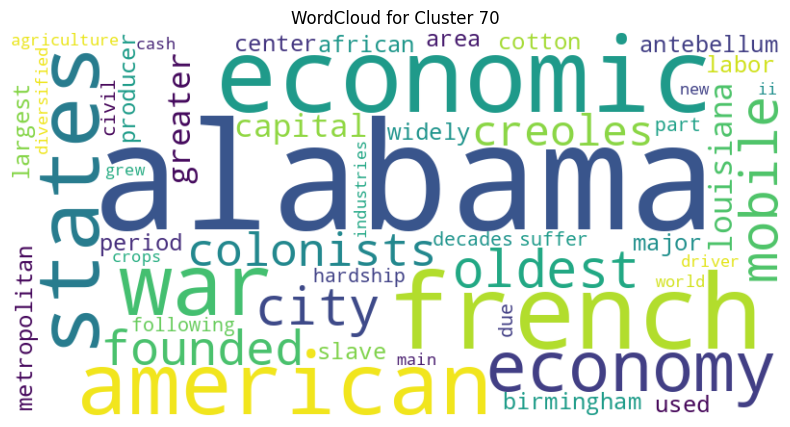


=== Bin 11 Range [0.50, 0.55) ===

--- Cluster 54 (size=68) ---
• Its aims include "abolishing the state", reciprocity, free association, voluntary contract, federation and monetary reform of both credit and currency that would be regulated by a bank of the people.
• The company also operates terminals in Mobile, Melvin, and Moundville.
• The plans include a $600million factory at the Brookley Aeroplex for the assembly of the A319, A320 and A321 aircraft.
• The Legislature is responsible for writing, debating, passing, or defeating state legislation.
• The executive branch is responsible for the execution and oversight of laws.


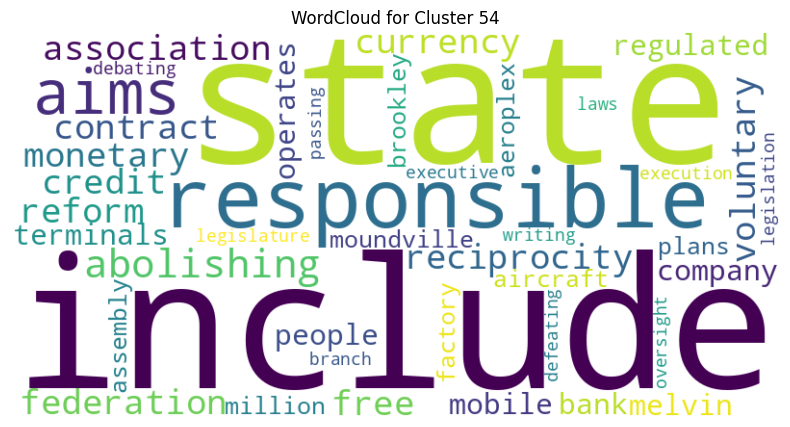


--- Cluster 55 (size=5) ---
• 10.
• 1.
• 1.
• 4.
• 1.


ValueError: We need at least 1 word to plot a word cloud, got 0.

In [81]:
analyze_bins(general_sentences, gene_inter_cluster, gene_inter_group_counts_kmeans)


=== Bin 1 Range [0.00, 0.05) ===

--- Cluster 60 (size=74) ---
• especially if the last woman he cared about loved someone else 
• someday 
• nadeen bought the lovely new clinical student a salad 
• i love that band 
• the boys would love a dinner night out 


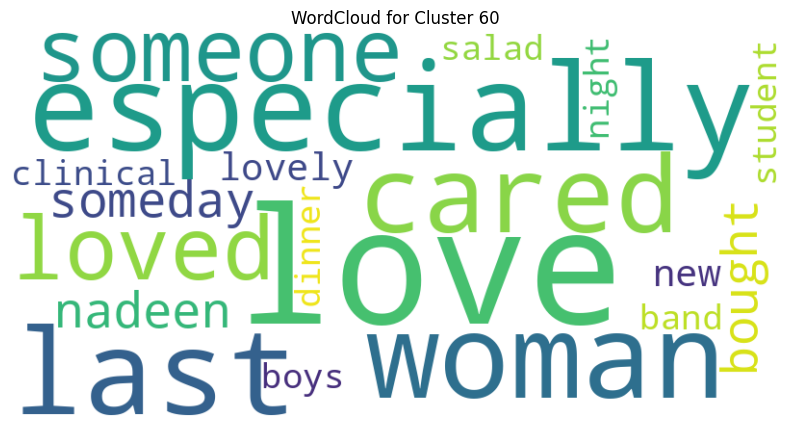


--- Cluster 61 (size=97) ---
• i could never , ever love another man like i do him 
• he thought his parents ' deaths would be the end of him ; two of the people he loved most in the world snuffed out with no chance to say good-bye .
• i thought he loved me .
• in my mind , i knew i was taken-my love conquered and sealed .
• jett had told me he was in love with me weeks ago .


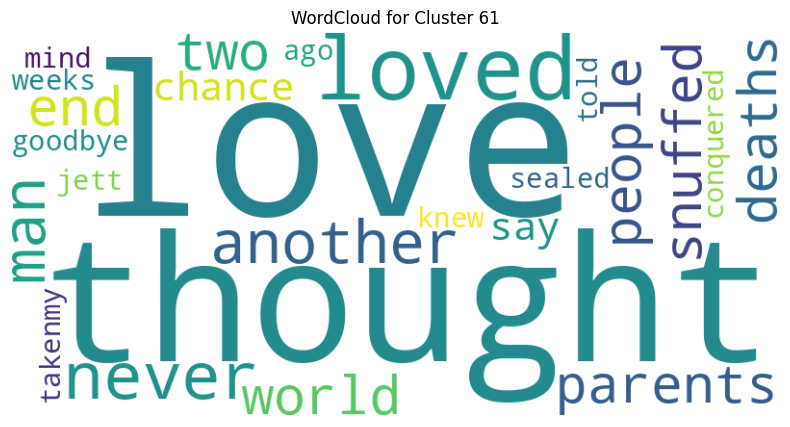


=== Bin 2 Range [0.05, 0.10) ===

--- Cluster 1 (size=68) ---
• as an indian love song flowed out from the speakers , megan wrapped her arms around pesh 's neck .
• chapter 7 for the next three weeks , we stayed hidden away in our lover 's paradise .
• he was with the boys until their bed times and then he 'd pull her into his arms and make love to her until she fell asleep .
• on those days , they would shop and leave right after dusk , falling into bed to make love until the morning .
• the anticipation of seeing nazar for dinner , knowing he would take her into his arms afterwards and make love to her for the better part of the night , made the whole day seem slow , while the nights flew by much too quickly .


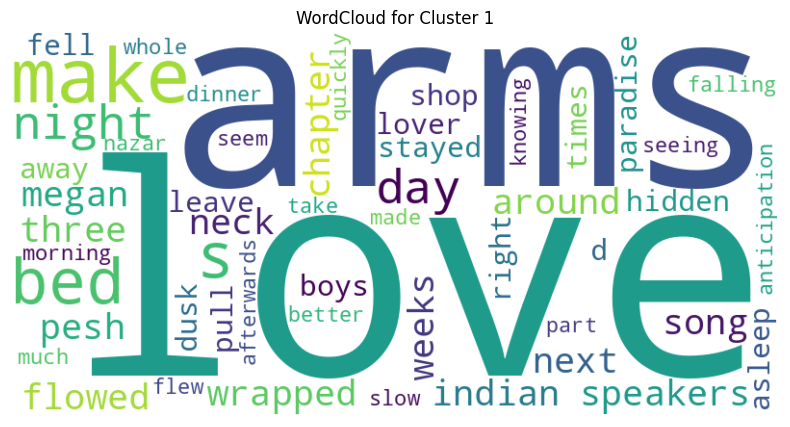


--- Cluster 2 (size=97) ---
• although it was strictly against the nursing code , she would have loved nothing more than to have throttled mr
• lips that would look lovely begging him to kiss her , he thought .
• to him , she was confirming her current lover 's name before proceeding and it added fuel to the fire of his increasing fury .
• as much as she loved these little guys , that pose was never good .
• she 'd stupidly translated those into words of love and commitment .


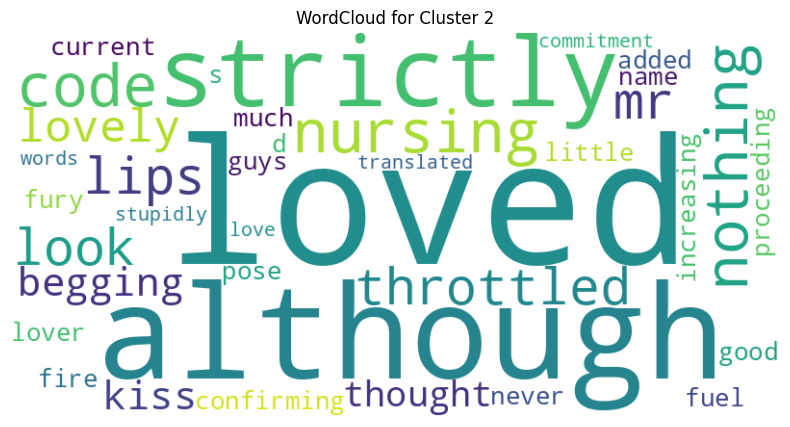

In [82]:
analyze_bins(love_sentences, love_final_cluster, love_final_group_counts_kmeans)


=== Bin 1 Range [0.00, 0.05) ===

--- Cluster 63 (size=73) ---
• i loved you when you were a penniless eighteen-year-old and i love you now ! ''
• or to add a bit of romance to his day ? ''
• the ones you used to bring out to your house and make love to in the stables or near the rose garden ? ''
• what does a lovely woman like you do during the daytime hours ? ''
• i love you too ! ''


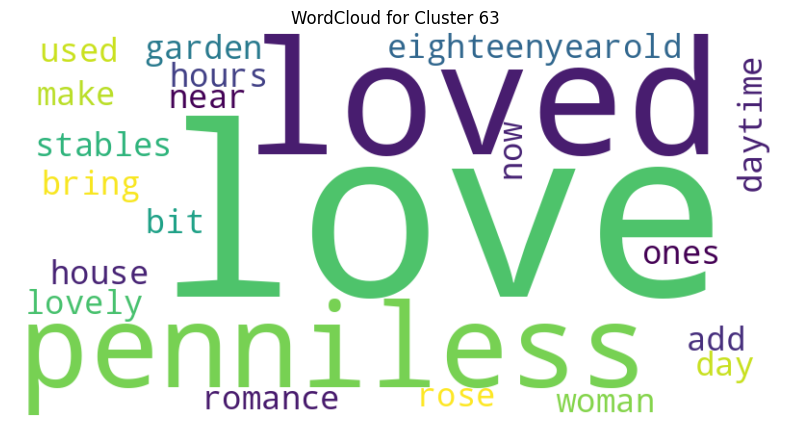


--- Cluster 64 (size=38) ---
• `` i love you 
• `` i love you 
• `` i love you 
• `` i love you 
• `` i love you 


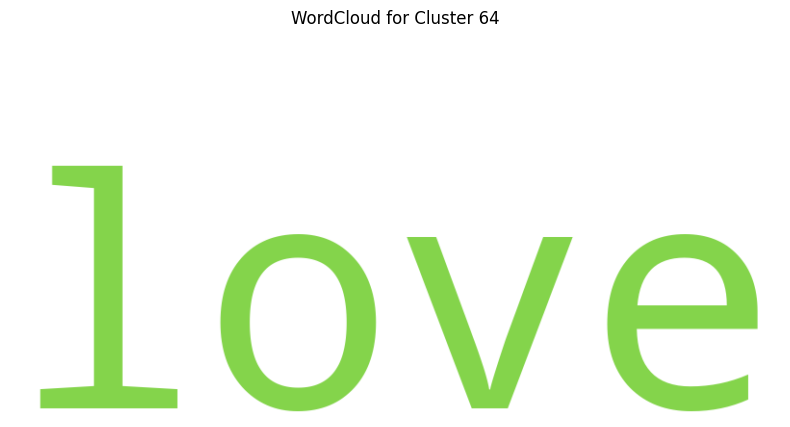


=== Bin 2 Range [0.05, 0.10) ===

--- Cluster 12 (size=39) ---
• well i 'd love to get lunch later this week , but i 'm having lunch with my friend allison today .
• i will not charge any of you with treason , but you need to understand why i love this woman .
• as the owner , i love showing guests around our operation .
• and even if i did propose before we dated much , i poured on the romance after that , believe me .
• do n't tell me you were in love with him , sophie because i will simply destroy the man .


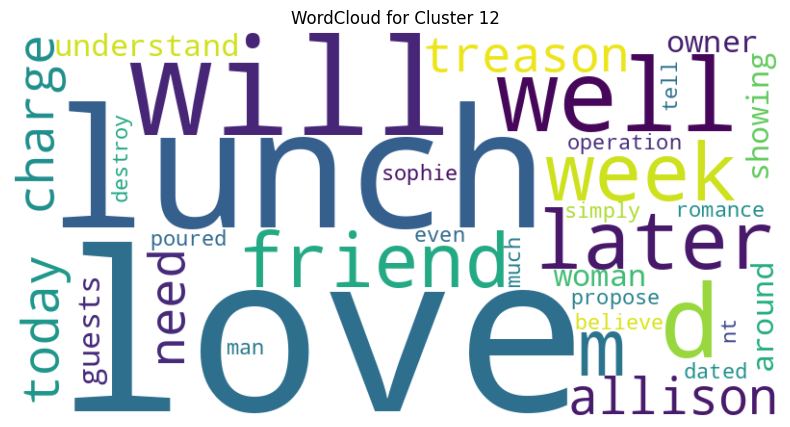


--- Cluster 13 (size=14) ---
• he wanted this lovely woman .
• this was the man she 'd thought herself in love with as a teenager .
• this was the man she loved .
• this was the man who was screwing everything up between him and the woman he loved .
• he needed the woman he loved .


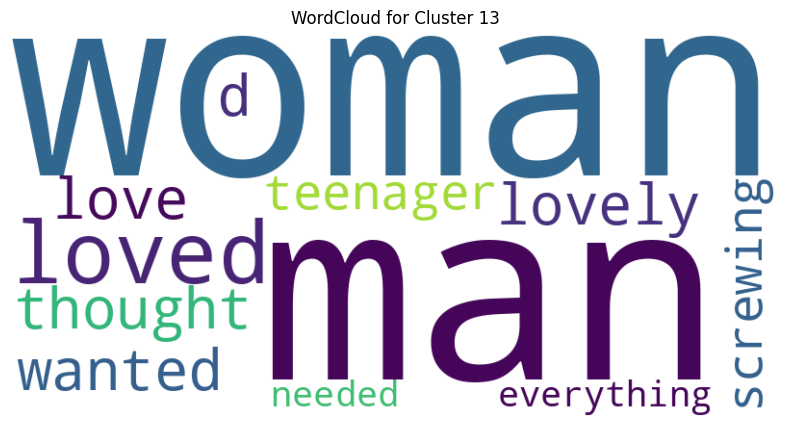


=== Bin 3 Range [0.10, 0.15) ===

--- Cluster 1 (size=78) ---
• as the others talked and laughed around him , aidan stared down at his son with such love in his eyes and adoration on his face that it cut a jagged hole in megan 's chest .
• my every nerve sizzles with anticipation as emerson unlocks our motel room love nest and walks in before me .
• malik walked into the house and siri 's heart swelled with love for the man when she noticed his eyes immediately looking for her , and then noticed his shoulders relaxing when he found her in the front room , obviously waiting for him .
• with her feet barely on the floor , she felt zayn hold her gently against his side as he tossed the pillows off of her love seat .
• dharr walked forward , his experienced eyes noting other features in the lovely woman that further piqued his interest .


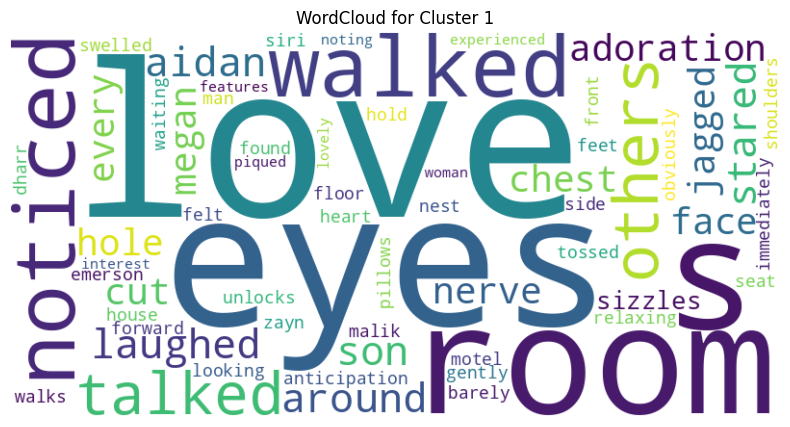


--- Cluster 2 (size=44) ---
• `` hmm , i love butter chicken , but i 'm also a fan of pav bahaji 
• `` regardless of your out-of-control emotions , i know that my family is going to love you just as much as i do 
• `` i love you so much , megan , and i want nothing more than to make you my wife 
• `` after davis , all i ever wanted was for my children to have a father who loved and adored them 
• `` zayn , i love wearing jeans 


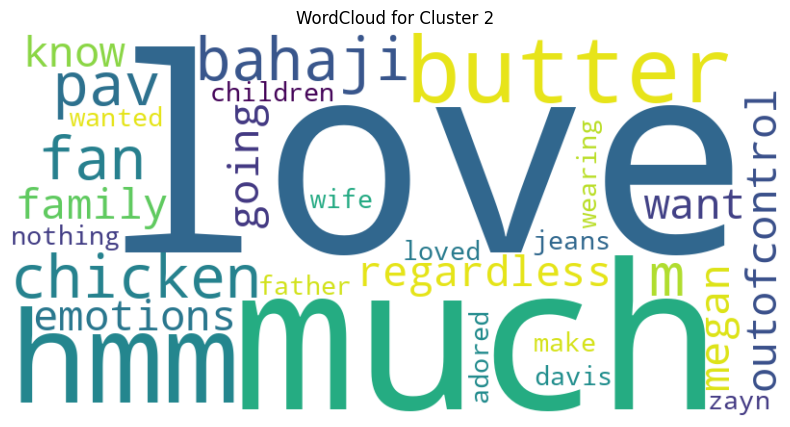

In [83]:
analyze_bins(love_sentences, love_inter_cluster, love_inter_group_counts_kmeans)

**Topic Modeling**

In [84]:
!pip install bertopic

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 24.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 572.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 39.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [85]:
def cluster_selection(cluster_counts, bin_index=0, num_bins=20):
    normalized_counts = normalize_counts(cluster_counts)
    bins = np.linspace(0, 1, num_bins + 1)

    bin_start = bins[bin_index]
    bin_end = bins[bin_index + 1]

    selected_clusters = [
        idx for idx, val in enumerate(normalized_counts)
        if bin_start <= val < bin_end
    ]

    print(f"Selected clusters in bin [{bin_start:.2f}, {bin_end:.2f}]:", selected_clusters)
    return selected_clusters

In [86]:
def run_topic_modeling_for_bin(sentences, clusters, cluster_ids, sample_size=50):
    from bertopic import BERTopic

    topic_models = {}

    for cid in cluster_ids:
        print(f"\n🔍 Topic modeling for Cluster {cid} (size={len(clusters[cid])})")

        cluster_sentences = [sentences[i] for i in clusters[cid][:sample_size]]

        topic_model = BERTopic(verbose=False)
        topics, probs = topic_model.fit_transform(cluster_sentences)

        topic_models[cid] = topic_model

        topic_model.visualize_barchart(top_n_topics=3).show()

    return topic_models

In [87]:
selected_clusters = cluster_selection(gene_final_group_counts_kmeans)
run_topic_modeling_for_bin(general_sentences, gene_final_cluster, selected_clusters)

Selected clusters in bin [0.00, 0.05]: [178, 179]

🔍 Topic modeling for Cluster 178 (size=56)


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

ValueError: 
The 'rows' argument to make_subplots must be an int greater than 0.
    Received value of type <class 'int'>: 0

## Analysis 6:
- How to build the hierarchy or the knowledge graph? Or the better question is, for random points and clusters, find the adjacent token cluster. Are they similar?
- Let's analyze taxonomy,

In [92]:
def compute_cluster_centers(embeddings, cluster_indices):
    cluster_centers = []
    for group in cluster_indices:
        vectors = embeddings[group]
        center = np.mean(vectors, axis=0).reshape(1, -1)
        cluster_centers.append(center)
    return np.vstack(cluster_centers)

In [102]:
def find_most_similar_clusters(embedding, clusters):
    centers = compute_cluster_centers(embedding, clusters)
    cluster_sim_matrix = cosine_similarity(centers)

    pairs = []
    n = cluster_sim_matrix.shape[0]
    for i in range(n):
        for j in range(i+1, n):
            sim = cluster_sim_matrix[i][j]
            pairs.append(((i, j), sim))
    return sorted(pairs, key=lambda x: -x[1])

In [97]:
def print_sample_sentences(sentences, clusters, cluster_id, sample_size=5):
    print(f"\nCluster {cluster_id} (size={len(clusters[cluster_id])})")
    for idx in clusters[cluster_id][:sample_size]:
        print("•", sentences[idx])

In [103]:
top_pairs = find_most_similar_clusters(gene_final_embeddings, gene_final_cluster)

for (i, j), sim in top_pairs:
    print(f"\n=== Cluster Pair ({i}, {j}) | Cosine Similarity: {sim:.3f} ===")
    print_sample_sentences(general_sentences, gene_final_cluster, i)
    print_sample_sentences(general_sentences, gene_final_cluster, j)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.

The death of Achilles, even if considered solely as it occurred in the oldest sources, is a complex one, with many different versions.
• Fate of Achilles' armour 

Achilles' armour was the object of a feud between Odysseus and Telamonian Ajax (Ajax the greater).
• Emancipation Proclamation

The Federal government's power to end slavery was limited by the Constitution, which before 1865 was understood to reserve the issue to the individual states.
• Loss and preservation 

Aristotle wrote his works on papyrus scrolls, the common writing medium of that era.

Cluster 158 (size=64)
• Human activities

Human activities (e.g., deforestation, farming, and urbanization) change the albedo of various areas around the globe.
• The number of private farms has declined at a steady rate since the 1960s, as land has been sold to developers, timber companies, and large farming conglomerates.
• Conservation 

Dramatic declines in amphibian populations, including pop

In [104]:
def plot_similarity_graph(embedding, clusters, threshold=0.8):
    centers = compute_cluster_centers(embedding, clusters)
    cluster_sim_matrix = cosine_similarity(centers)

    G = nx.Graph()
    n = cluster_sim_matrix.shape[0]
    for i in range(n):
        for j in range(i+1, n):
            sim = cluster_sim_matrix[i][j]
            if sim >= threshold:
                G.add_edge(i, j, weight=sim)
    nx.draw(G, with_labels=True, node_color='lightblue', edge_color='gray')
    plt.title(f"Cluster Similarity Graph (Threshold={threshold})")
    plt.show()

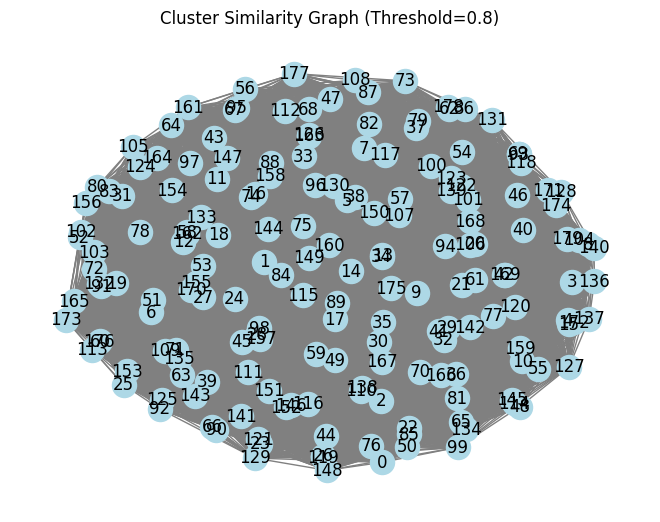

In [105]:
plot_similarity_graph(gene_final_embeddings, gene_final_cluster)

1. Hierarchical categorization of clusters to create a “parent category → child category” structure
2. Identify central nodes (hubs) based on similarity between clusters and analyze the structure spread around them

In [106]:
from scipy.cluster.hierarchy import linkage, dendrogram

def plot_cluster_hierarchy(embeddings, clusters, method='ward'):
    centers = compute_cluster_centers(embeddings, clusters)
    Z = linkage(centers, method=method)  # 'ward', 'single', 'complete', etc.

    plt.figure(figsize=(12, 5))
    dendrogram(Z, labels=[str(i) for i in range(len(centers))])
    plt.title("Hierarchical Clustering of Cluster Centers")
    plt.xlabel("Cluster Index")
    plt.ylabel("Distance")
    plt.show()

In [122]:
def identify_hub_clusters(embeddings, clusters, threshold=0.8):
    centers = compute_cluster_centers(embeddings, clusters)
    sim_matrix = cosine_similarity(centers)

    G = nx.Graph()
    n = sim_matrix.shape[0]
    for i in range(n):
        for j in range(i+1, n):
            if sim_matrix[i][j] >= threshold:
                G.add_edge(i, j, weight=sim_matrix[i][j])

    centrality = nx.pagerank(G)  # nx.degree_centrality(G), nx.pagerank(G), nx.betweenness_centrality(G)
    sorted_hubs = sorted(centrality.items(), key=lambda x: -x[1])[:5]  # top-5 center cluster

    print("Top Hub Clusters:")
    for cid, score in sorted_hubs:
        print(f"Cluster {cid}: Centrality Score = {score:.3f}")

    return G, sorted_hubs

In [123]:
def plotting_hub_cluster(embeddings, clusters, sentences, sample_size=5):
    G, hubs = identify_hub_clusters(embeddings, clusters)
    pos = nx.spring_layout(G, k=0.5, iterations=50, seed=42)

    plt.figure(figsize=(10, 10))
    nx.draw(G, pos, with_labels=True, node_color='lightblue', edge_color='black')
    hub_nodes = [cid for cid, _ in hubs]
    nx.draw_networkx_nodes(G, pos, nodelist=hub_nodes, node_color='orange')
    plt.title("Hub-centered Cluster Similarity Graph")
    plt.show()

    hub_ids = [cid for cid, _ in hubs]
    print("\n=== Representative Sentences from Hub Clusters ===")
    for cid in hub_ids:
        cluster_sents = [sentences[i] for i in clusters[cid]]
        print(f"\n--- Cluster {cid} (Size: {len(cluster_sents)}) ---")
        for sent in cluster_sents[:sample_size]:
            print("•", sent)


Top Hub Clusters:
Cluster 0: Centrality Score = 0.006
Cluster 1: Centrality Score = 0.006
Cluster 2: Centrality Score = 0.006
Cluster 3: Centrality Score = 0.006
Cluster 4: Centrality Score = 0.006


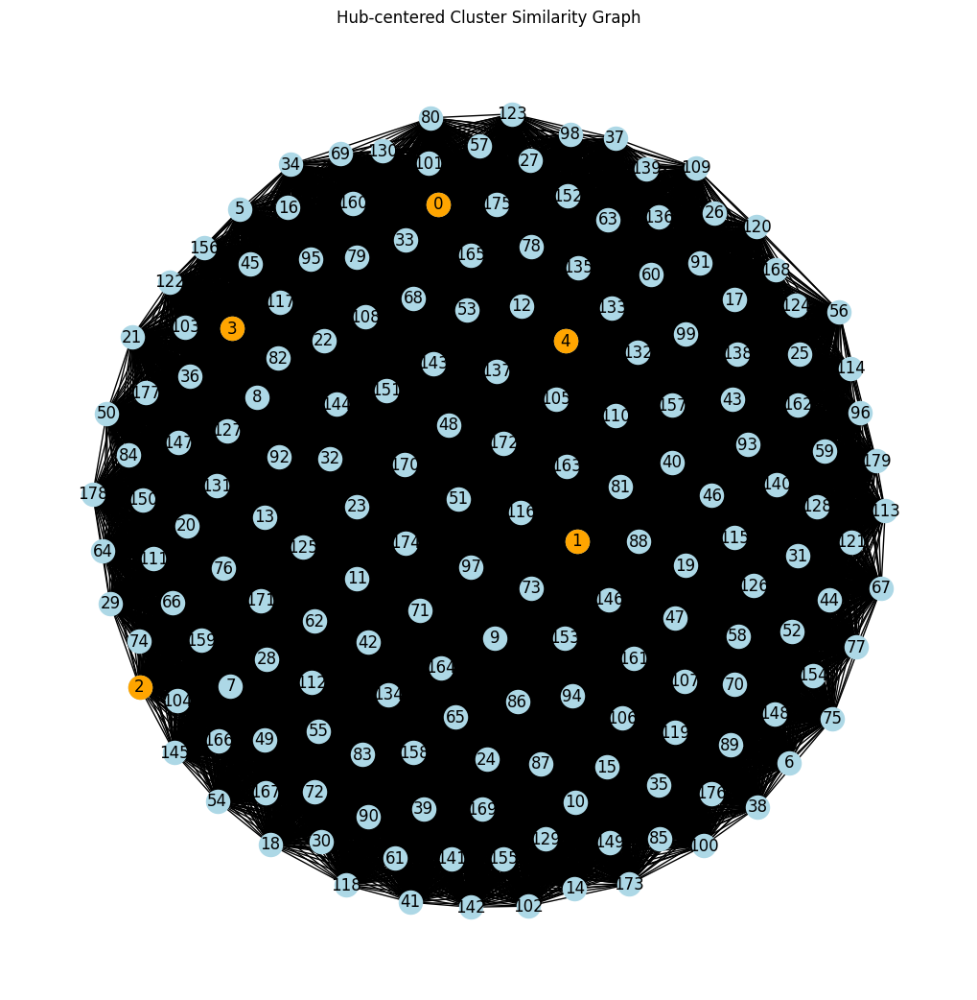


=== Representative Sentences from Hub Clusters ===

--- Cluster 0 (Size: 50) ---
• The law subjects doctors who perform abortions with 10 to 99 years imprisonment.
• After leading in the first six rounds of voting, he was unable to obtain a majority.
• Her preferred form of government was a constitutional republic that is limited to the protection of individual rights.
• Despite usurpation, military coups and occasional mob rule, the day-to-day operation of the Deylikal government was remarkably orderly.
• Ben Bella was overthrown in 1965 by Houari Boumédiène, his former ally and defence minister.

--- Cluster 1 (Size: 102) ---
• Zeus and Poseidon had been rivals for Thetis's hand in marriage until Prometheus, the fore-thinker, warned Zeus of a prophecy (originally uttered by Themis, goddess of divine law) that Thetis would bear a son greater than his father.
• He was ambidextrous, and cast a spear from each hand; one grazed Achilles' elbow, "drawing a spurt of blood".
• Peleus entrus

In [124]:
plotting_hub_cluster(gene_final_embeddings, gene_final_cluster, general_sentences)

Top Hub Clusters:
Cluster 0: Centrality Score = 0.006
Cluster 1: Centrality Score = 0.006
Cluster 2: Centrality Score = 0.006
Cluster 3: Centrality Score = 0.006
Cluster 4: Centrality Score = 0.006


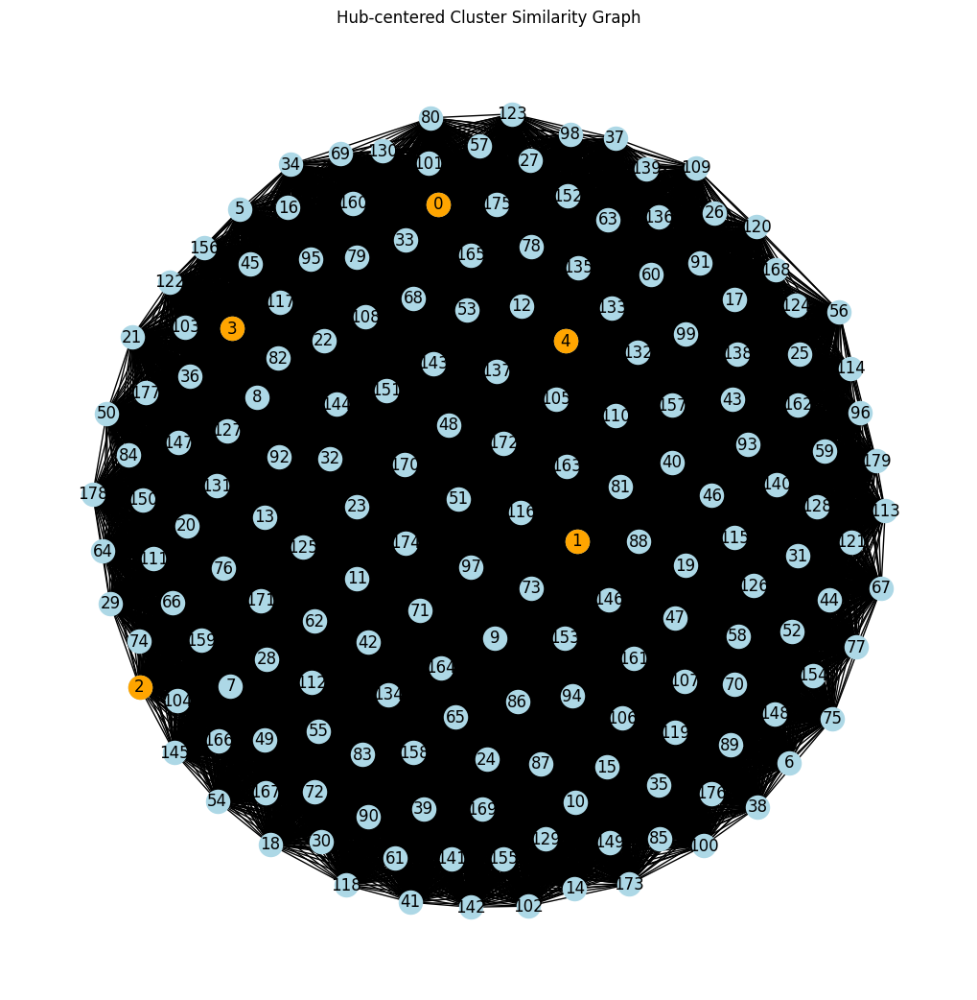


=== Representative Sentences from Hub Clusters ===

--- Cluster 0 (Size: 25) ---
• Also, the bones of Antilocus, who had become closer to Achilles than any other following Patroclus' death, were separately enclosed.
• Armstrong was acquitted.
• The Democrats nominated former Secretary of State James Buchanan and the Know-Nothings nominated former Whig President Millard Fillmore.
• Lincoln and Douglas competed for votes in the North, while Bell and Breckinridge primarily found support in the South.
• Republican speakers focused first on the party platform, and second on Lincoln's life story, emphasizing his childhood poverty.

--- Cluster 1 (Size: 84) ---
• Most land areas are in an albedo range of 0.1 to 0.4.
• Many fonts then made the right leg vertical.
• The area also drew many poor, disenfranchised people who became subsistence farmers.
• Following the war, the state remained chiefly agricultural, with an economy tied to cotton.
• Besides the short-lived original Ku Klux Klan, the

In [125]:
plotting_hub_cluster(gene_inter_embeddings, gene_inter_cluster, general_sentences)

Top Hub Clusters:
Cluster 0: Centrality Score = 0.006
Cluster 1: Centrality Score = 0.006
Cluster 2: Centrality Score = 0.006
Cluster 3: Centrality Score = 0.006
Cluster 4: Centrality Score = 0.006


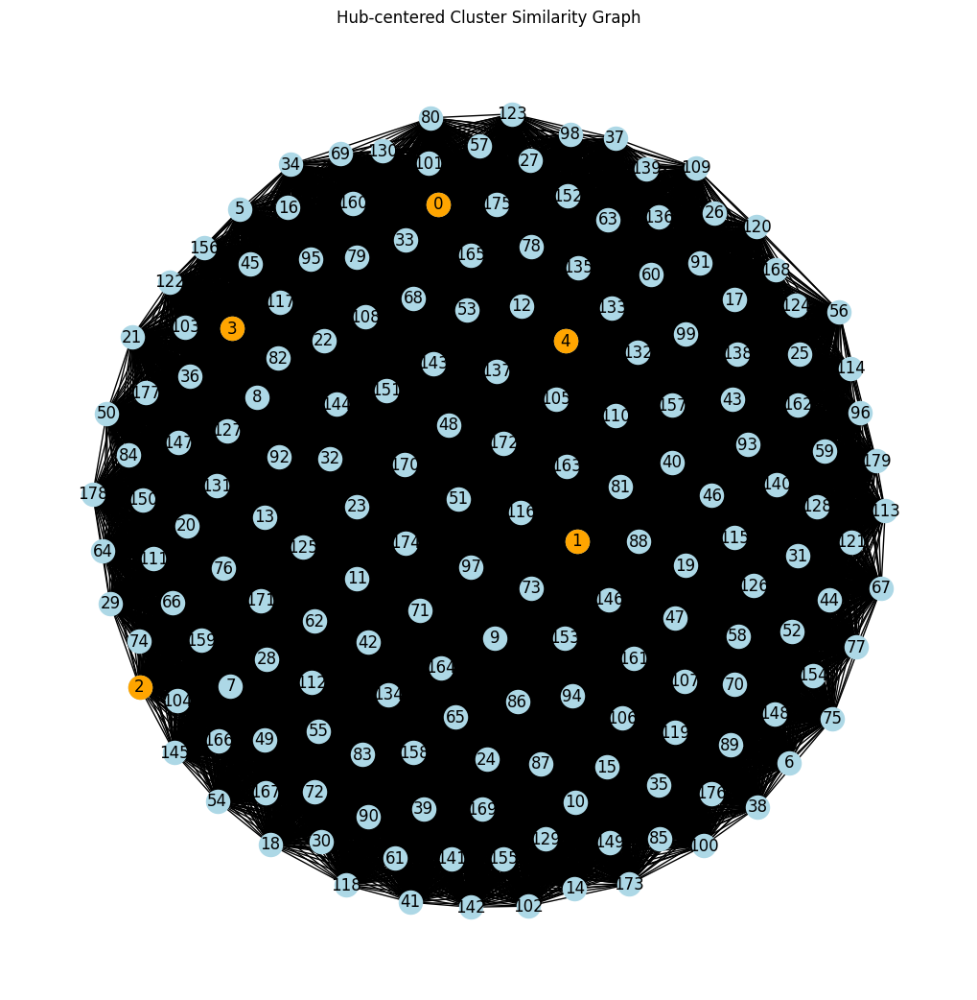


=== Representative Sentences from Hub Clusters ===

--- Cluster 0 (Size: 1167) ---
• ''
• ''
• ''
• ''
• ''

--- Cluster 1 (Size: 68) ---
• as an indian love song flowed out from the speakers , megan wrapped her arms around pesh 's neck .
• chapter 7 for the next three weeks , we stayed hidden away in our lover 's paradise .
• he was with the boys until their bed times and then he 'd pull her into his arms and make love to her until she fell asleep .
• on those days , they would shop and leave right after dusk , falling into bed to make love until the morning .
• the anticipation of seeing nazar for dinner , knowing he would take her into his arms afterwards and make love to her for the better part of the night , made the whole day seem slow , while the nights flew by much too quickly .

--- Cluster 2 (Size: 97) ---
• although it was strictly against the nursing code , she would have loved nothing more than to have throttled mr
• lips that would look lovely begging him to kiss her , h

In [126]:
plotting_hub_cluster(love_final_embeddings, love_final_cluster, love_sentences)

Top Hub Clusters:
Cluster 0: Centrality Score = 0.006
Cluster 1: Centrality Score = 0.006
Cluster 2: Centrality Score = 0.006
Cluster 3: Centrality Score = 0.006
Cluster 4: Centrality Score = 0.006


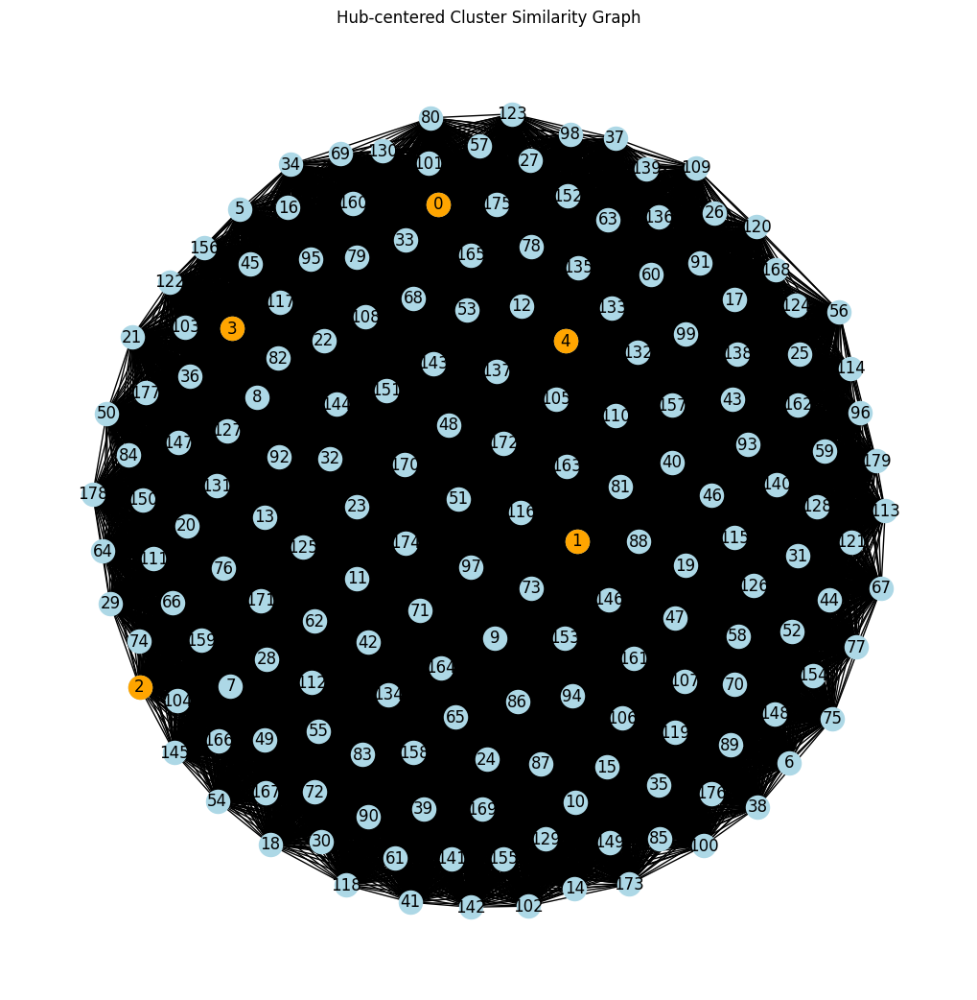


=== Representative Sentences from Hub Clusters ===

--- Cluster 0 (Size: 1167) ---
• ''
• ''
• ''
• ''
• ''

--- Cluster 1 (Size: 78) ---
• as the others talked and laughed around him , aidan stared down at his son with such love in his eyes and adoration on his face that it cut a jagged hole in megan 's chest .
• my every nerve sizzles with anticipation as emerson unlocks our motel room love nest and walks in before me .
• malik walked into the house and siri 's heart swelled with love for the man when she noticed his eyes immediately looking for her , and then noticed his shoulders relaxing when he found her in the front room , obviously waiting for him .
• with her feet barely on the floor , she felt zayn hold her gently against his side as he tossed the pillows off of her love seat .
• dharr walked forward , his experienced eyes noting other features in the lovely woman that further piqued his interest .

--- Cluster 2 (Size: 44) ---
• `` hmm , i love butter chicken , but i 'm als

In [127]:
plotting_hub_cluster(love_inter_embeddings, love_inter_cluster, love_sentences)